In [646]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [647]:
df = pd.read_csv("/home/margaritisvoliotis/Documents/AMR classification model/AMR_classification_model-Tailise1-patch-1/CIP_23_best_features.csv")

df

,exp_order,exp_id,file,sample_id,species,strain_name,strain_phenotype,MIC Sensititre,dataset,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,...,std_var_length_drug 3h,mean_var_length_drug 2.5h,max_var_length_drug 3h,max_var_length_drug 2.5h,std_var_length_drug 2.5h,mean_var_length_drug 1.5h,std_var_length_drug 1.5h,resistant_cells_percentage_drug_2.5h,resistant_cells_percentage_drug_2h,Length var coef drug
0,448,42ff15,qsd-features-20220607/240808_42ff15-22602.bin,nfCIP031,P. aeruginosa,CH5528,R,NaN,permanent_test,0.27,...,0.399362,0.811110,1.705302,0.879961,0.119705,0.756175,0.175060,53.333333,78.333333,0.157017
1,449,47011b,qsd-features-20220607/240808_47011b-22631.bin,nfCIP031,P. aeruginosa,CH5528,R,NaN,permanent_test,0.80,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,450,120529,qsd-features-20220607/240808_120529-22611.bin,nfCIP031,P. aeruginosa,CH5528,R,NaN,permanent_test,0.50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,451,150563,qsd-features-20220607/240829_150563-23003.bin,nfCIP049,P. aeruginosa,MHH14929,R,NaN,permanent_test,0.59,...,0.097138,0.368637,0.480262,0.480262,0.101674,0.448991,0.044223,0.000000,3.333333,0.185707
4,452,22044c,qsd-features-20220607/240829_22044c-23002.bin,nfCIP049,P. aeruginosa,MHH14929,R,NaN,permanent_test,0.54,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,512,33014b,qsd-features-20220607/250904_33014b-26852.bin,MAD119,P. aeruginosa,ESP009,R,NaN,permanent_test,1.26,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65,513,340128,qsd-features-20220607/250904_340128-26851.bin,MAD119,P. aeruginosa,ESP009,R,NaN,permanent_test,0.52,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
66,514,320150,qsd-features-20220607/250905_320150-26858.bin,MAD120,P. aeruginosa,ESP012,R,NaN,permanent_test,0.79,...,0.033929,0.556642,0.596118,0.596118,0.043468,0.558609,0.053047,80.000000,95.000000,0.057970
67,515,33014c,qsd-features-20220607/250905_33014c-26859.bin,MAD120,P. aeruginosa,ESP012,R,NaN,permanent_test,0.59,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [648]:
nanomotion_features = df.iloc[:, 9:19]


In [649]:
nanomotion_features

,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,over_drug-030-060_drug-000-030__over_over_minus_p90_p10_minus_p60_p40_00400-01000Hz_over_minus_p90_p10_minus_p60_p40_00100-00200Hz,over_drug-030-060_drug-000-030__over_p50_07000-08000Hz_p50_06000-07000Hz,over_drug-060-090_drug-000-030__over_p50_08000-10000Hz_p50_04000-05000Hz,drug-000-030__over_minus_p90_p10_06000-07000Hz_minus_p90_p10_01000-02000Hz,over_drug-060-090_drug-000-030__p70_08000-10000Hz,over_drug-060-090_drug-030-060__over_minus_p90_p50_08000-10000Hz_minus_p90_p50_07000-08000Hz,over_drug-060-090_drug-030-060__over_minus_p60_p40_08000-10000Hz_minus_p60_p40_04000-05000Hz,over_drug-060-090_drug-030-060__over_p90_02000-04000Hz_p90_00100-00200Hz,drug-030-060__over_p20_07000-08000Hz_p20_01000-02000Hz
0,0.27,1.03,1.00,1.01,6.29,1.01,1.00,1.00,0.52,10.02
1,0.80,0.97,1.00,1.00,6.28,1.06,1.00,0.99,0.82,9.84
2,0.50,0.98,1.00,1.01,6.45,1.01,1.00,1.00,1.20,9.89
3,0.59,0.94,1.00,0.98,6.09,1.00,0.99,0.99,0.63,9.45
4,0.54,0.98,1.00,0.98,6.13,1.04,0.98,0.98,0.50,9.31
...,...,...,...,...,...,...,...,...,...,...
64,1.26,1.01,1.01,1.02,5.67,1.02,1.00,1.01,1.10,8.98
65,0.52,0.96,1.00,1.00,6.05,1.00,1.00,0.99,0.59,9.57
66,0.79,1.09,1.00,1.02,5.52,1.01,1.00,1.01,0.92,8.73
67,0.59,0.88,1.00,1.00,5.65,1.01,1.00,1.00,0.79,8.76


In [650]:
microfluidics_features = df.iloc[:,40:50]
microfluidics_features = microfluidics_features.dropna().reset_index()
# Applying the method
check_nan = microfluidics_features.isnull().values.any()

# printing the result
print(check_nan)
microfluidics_features = microfluidics_features.drop(columns = "index")

False


In [651]:
microfluidics_features

,mean_var_length_drug 3h,std_var_length_drug 3h,mean_var_length_drug 2.5h,max_var_length_drug 3h,max_var_length_drug 2.5h,std_var_length_drug 2.5h,mean_var_length_drug 1.5h,std_var_length_drug 1.5h,resistant_cells_percentage_drug_2.5h,resistant_cells_percentage_drug_2h
0,1.051808,0.399362,0.811110,1.705302,0.879961,0.119705,0.756175,0.175060,53.333333,78.333333
1,0.332749,0.097138,0.368637,0.480262,0.480262,0.101674,0.448991,0.044223,0.000000,3.333333
2,3.056454,1.018101,2.877507,3.907634,0.572292,0.072001,0.477855,0.047367,28.333333,60.000000
3,0.743663,0.198668,0.661816,1.064225,0.878552,0.150269,0.572226,0.057488,35.000000,70.000000
4,0.333961,0.092097,0.299639,0.498608,0.375127,0.057271,0.327682,0.067098,55.000000,90.000000
5,1.798038,1.265963,2.415369,3.797151,3.797151,0.967015,3.083933,1.008642,0.000000,0.000000
6,6.258197,4.842615,3.316668,13.432974,5.909392,1.833612,2.070599,0.498691,0.000000,3.333333
7,2.440751,1.584758,1.597574,4.343991,3.161191,1.144822,0.765345,0.302610,0.000000,3.333333
8,4.438974,3.243955,2.582580,9.824426,4.160825,1.374315,1.462562,0.478033,0.000000,1.666667
9,4.322394,2.758819,2.819658,7.831848,5.403376,1.866266,1.508021,0.575244,3.333333,5.000000


In [652]:
# Take mean of each group of 3 rows
nanomotion_triplet_mean = (
    nanomotion_features
    .groupby(np.arange(len(nanomotion_features)) // 3)
    .mean()
)
nanomotion_triplet_mean

,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,over_drug-030-060_drug-000-030__over_over_minus_p90_p10_minus_p60_p40_00400-01000Hz_over_minus_p90_p10_minus_p60_p40_00100-00200Hz,over_drug-030-060_drug-000-030__over_p50_07000-08000Hz_p50_06000-07000Hz,over_drug-060-090_drug-000-030__over_p50_08000-10000Hz_p50_04000-05000Hz,drug-000-030__over_minus_p90_p10_06000-07000Hz_minus_p90_p10_01000-02000Hz,over_drug-060-090_drug-000-030__p70_08000-10000Hz,over_drug-060-090_drug-030-060__over_minus_p90_p50_08000-10000Hz_minus_p90_p50_07000-08000Hz,over_drug-060-090_drug-030-060__over_minus_p60_p40_08000-10000Hz_minus_p60_p40_04000-05000Hz,over_drug-060-090_drug-030-060__over_p90_02000-04000Hz_p90_00100-00200Hz,drug-030-060__over_p20_07000-08000Hz_p20_01000-02000Hz
0,0.523333,0.993333,1.000000,1.006667,6.340000,1.026667,1.000000,0.996667,0.846667,9.916667
1,0.583333,0.966667,1.000000,0.990000,6.236667,1.016667,0.990000,0.990000,0.630000,9.736667
2,0.850000,0.983333,1.000000,1.003333,5.483333,1.006667,1.000000,1.000000,0.756667,8.623333
3,0.660000,0.986667,1.000000,1.006667,6.620000,1.006667,1.000000,1.000000,0.810000,10.170000
4,0.983333,0.986667,1.000000,1.020000,6.040000,1.026667,1.000000,1.006667,1.050000,9.453333
5,1.266667,0.953333,1.000000,1.013333,5.990000,1.003333,0.996667,1.003333,1.070000,9.436667
6,1.500000,0.976667,1.000000,1.000000,6.013333,1.006667,0.996667,0.996667,1.196667,9.566667
7,1.040000,0.996667,1.000000,1.016667,5.656667,0.996667,1.000000,1.003333,1.210000,8.930000
8,1.533333,0.990000,1.020000,1.086667,6.026667,1.026667,1.006667,1.013333,1.150000,9.336667
9,1.826667,1.006667,1.000000,0.996667,5.140000,1.003333,0.996667,1.000000,1.413333,7.963333


## Correlation computation

The correlation used in this analysis is the **Pearson correlation coefficient**, which measures the linear relationship between two variables. It is the default method used by:

```python
nanomotion_triplet_mean[nano_col].corr(amr_features[amr_col])


In [653]:
from scipy.stats import pearsonr, spearmanr
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


In [654]:
def plot_display_save_heatmap(corr_matrix, title, filename):
    plt.figure(figsize=(18, 14))
    plt.imshow(corr_matrix, aspect='auto')
    plt.colorbar()

    # Big column labels
    plt.xticks(
        range(len(corr_matrix.columns)),
        corr_matrix.columns,
        rotation=90,
        fontsize=16,
        fontweight='bold'
    )

    plt.yticks(
        range(len(corr_matrix.index)),
        corr_matrix.index,
        fontsize=16
    )

    plt.title(title, fontsize=14)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.40, left=0.25)

    # --- SAVE BEFORE SHOW ---
    plt.savefig(os.path.join(output_folder, filename),
                dpi=300, bbox_inches='tight')

    plt.show()
    plt.close()


In [655]:
# --- Make sure the folder exists ---
output_folder = "correlation_results"
os.makedirs(output_folder, exist_ok=True)

# # --- Function to compute full pairwise correlation matrix ---
# def compute_corr_matrix_loop(df1, df2, method='pearson'):
#     corr_matrix = pd.DataFrame(
#         np.zeros((df1.shape[1], df2.shape[1])),
#         index=df1.columns,
#         columns=df2.columns
#     )
#     for nano_col in df1.columns:
#         for micro_col in df2.columns:
#             corr_matrix.loc[nano_col, micro_col] = df1[nano_col].corr(df2[micro_col], method=method)
#     return corr_matrix

# # --- Compute correlation matrices ---
# corr_matrix_pearson = compute_corr_matrix_loop(nanomotion_triplet_mean, microfluidics_features, method='pearson')
# corr_matrix_spearman = compute_corr_matrix_loop(nanomotion_triplet_mean, microfluidics_features, method='spearman')
# corr_matrix_kendall = compute_corr_matrix_loop(nanomotion_triplet_mean, microfluidics_features, method='kendall')




# # --- Plot, display, and save all three heatmaps ---
# plot_display_save_heatmap(corr_matrix_pearson, 
#                           "Pearson Correlation Heatmap: Nanomotion vs Microfluidics Features", 
#                           "pearson_correlation_heatmap.png")

# plot_display_save_heatmap(corr_matrix_spearman, 
#                           "Spearman Correlation Heatmap: Nanomotion vs Microfluidics Features", 
#                           "spearman_correlation_heatmap.png")

# plot_display_save_heatmap(corr_matrix_kendall, 
#                           "Kendall Tau Correlation Heatmap: Nanomotion vs Microfluidics Features", 
#                           "kendall_correlation_heatmap.png")


In [656]:
# import pandas as pd
# import numpy as np
# from scipy.stats import pearsonr, spearmanr, kendalltau

# def compute_corr_and_p(df1, df2, method='pearson'):
#     corr_matrix = pd.DataFrame(
#         index=df1.columns,
#         columns=df2.columns,
#         dtype=float
#     )
#     p_matrix = corr_matrix.copy()

#     for c1 in df1.columns:
#         for c2 in df2.columns:

#             # Align the series on common index
#             x, y = df1[c1].align(df2[c2], join='inner')
#             mask = x.notna() & y.notna()
#             x = x[mask].values
#             y = y[mask].values

#             if len(x) < 2:
#                 r, p = np.nan, np.nan
#             else:
#                 if method == 'pearson':
#                     r, p = pearsonr(x, y)
#                 elif method == 'spearman':
#                     r, p = spearmanr(x, y)
#                 elif method == 'kendall':
#                     r, p = kendalltau(x, y)  # Kendall τ
#                 else:
#                     raise ValueError("method must be 'pearson', 'spearman', or 'kendall'")

#             corr_matrix.loc[c1, c2] = r
#             p_matrix.loc[c1, c2] = p

#     return corr_matrix, p_matrix


In [657]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau
from statsmodels.stats.multitest import multipletests

def compute_corr_and_p(df1, df2, method='pearson', fdr_method='fdr_bh'):

    """What BH does

    Controls the expected proportion of false positives among all rejected hypotheses
    
    Much less stringent than Bonferroni
    
    Assumes tests are independent or positively correlated
    
    Standard choice in biology, omics, AMR, phenotyping
    
    
    alpha controls proportion of allowed false positive

    0.1 means up to 10% of discoveries may be false positives”
    
    """
    
    corr_matrix = pd.DataFrame(
        index=df1.columns,
        columns=df2.columns,
        dtype=float
    )
    p_matrix = corr_matrix.copy()

    for c1 in df1.columns:
        for c2 in df2.columns:

            # Align the series on common index
            x, y = df1[c1].align(df2[c2], join='inner')
            mask = x.notna() & y.notna()
            x = x[mask].values
            y = y[mask].values

            if len(x) < 2:
                r, p = np.nan, np.nan
            else:
                if method == 'pearson':
                    r, p = pearsonr(x, y)
                elif method == 'spearman':
                    r, p = spearmanr(x, y)
                elif method == 'kendall':
                    r, p = kendalltau(x, y)
                else:
                    raise ValueError("method must be 'pearson', 'spearman', or 'kendall'")

            corr_matrix.loc[c1, c2] = r
            p_matrix.loc[c1, c2] = p

    # ---------- FDR correction ----------
    pvals = p_matrix.values.flatten()
    valid = ~np.isnan(pvals)
    
    pvals_fdr = np.full_like(pvals, np.nan, dtype=float)
    
    if valid.any():
        reject, pvals_corr, _, _ = multipletests(
            pvals[valid],
            alpha=0.1,
            method="fdr_bh"
        )
        pvals_fdr[valid] = pvals_corr
    
    p_fdr_matrix = pd.DataFrame(
        pvals_fdr.reshape(p_matrix.shape),
        index=p_matrix.index,
        columns=p_matrix.columns
    )


    return corr_matrix, p_matrix, p_fdr_matrix


In [658]:
def p_to_stars(p):
    if pd.isna(p):
        return ""
    elif p < 1e-4:
        return "****"
    elif p < 1e-3:
        return "***"
    elif p < 1e-2:
        return "**"
    elif p < 5e-2:
        return "*"
    else:
        return ""


In [659]:
# def plot_corr_with_sig_imshow(
#     corr,
#     pvals,
#     title,
#     filename,
#     output_folder
# ):
#     plt.figure(figsize=(18, 14))

#     # Plot correlation matrix
#     im = plt.imshow(
#         corr,
#         aspect='auto',
#         vmin=-1,
#         vmax=1
#     )

#     plt.colorbar(im)

#     # Axis labels
#     plt.xticks(
#         range(len(corr.columns)),
#         corr.columns,
#         rotation=90,
#         fontsize=16,
#         fontweight='bold'
#     )

#     plt.yticks(
#         range(len(corr.index)),
#         corr.index,
#         fontsize=16
#     )

#     # Add significance stars
#     for i in range(corr.shape[0]):
#         for j in range(corr.shape[1]):
#             stars = p_to_stars(pvals.iloc[i, j])
#             if stars:
#                 plt.text(
#                     j, i, stars,
#                     ha='center',
#                     va='center',
#                     color='black',
#                     fontsize=14,
#                     fontweight='bold'
#                 )

#     plt.title(title, fontsize=14)

#     plt.tight_layout()
#     plt.subplots_adjust(bottom=0.40, left=0.25)

#     os.makedirs(output_folder, exist_ok=True)

#     plt.savefig(
#         os.path.join(output_folder, filename),
#         dpi=300,
#         bbox_inches='tight'
#     )

#     plt.close()


In [660]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

def plot_corr_with_sig_imshow(
    pvals_raw,
    pvals_fdr,
    title,
    filename,
    output_folder,
    p_min=1e-4
):
    """
    pvals_raw : DataFrame of raw p-values
    pvals_fdr : DataFrame of FDR-corrected p-values (q-values)
    """

    # Transform for color scaling
    p_for_color = -np.log10(pvals_raw.clip(lower=p_min))

    # Dynamically scale figure size
    n_rows, n_cols = pvals_raw.shape
    figsize = (max(12, n_cols * 1.2), max(10, n_rows * 1.2))

    plt.figure(figsize=figsize)

    im = plt.imshow(
        p_for_color,
        aspect="auto",
        cmap="Greys",
        vmin=0,
        vmax=-np.log10(p_min)
    )

    cbar = plt.colorbar(im)
    cbar.set_label(r"$-\log_{10}(p)$", fontsize=14)

    # Axis labels
    plt.xticks(
        range(n_cols),
        pvals_raw.columns,
        rotation=90,
        fontsize=12
    )

    plt.yticks(
        range(n_rows),
        pvals_raw.index,
        fontsize=12
    )

    # Annotate raw p-values, bold if FDR-significant
    for i in range(n_rows):
        for j in range(n_cols):
            p = pvals_raw.iloc[i, j]
            q = pvals_fdr.iloc[i, j]

            if np.isnan(p):
                continue

            if p < p_min:
                text = "<1e-4"
            else:
                text = f"{p:.2e}"

            # Choose text color for contrast
            text_color = "white" if p_for_color.iloc[i, j] > (-np.log10(p_min) * 0.6) else "black"

            plt.text(
                j, i, text,
                ha="center",
                va="center",
                fontsize=10,
                fontweight="bold" if (pd.notna(q) and q < 0.05) else "normal",
                color=text_color
            )

    plt.title(
        title + "\n(Bold values indicate FDR q < 0.05)",
        fontsize=16
    )

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.35, left=0.25)

    os.makedirs(output_folder, exist_ok=True)
    plt.savefig(
        os.path.join(output_folder, filename),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close()


In [661]:
def compute_figsize(n_rows, n_cols,
                    base=(10, 8),
                    scale=1.2,
                    threshold=8):
    """
    Automatically compute figure size for heatmaps with annotations.
    """
    width, height = base

    if n_cols > threshold:
        width = base[0] + scale * (n_cols - threshold)

    if n_rows > threshold:
        height = base[1] + scale * (n_rows - threshold)

    return (width, height)


In [662]:
import numpy as np
import matplotlib.pyplot as plt
import os

def plot_corr_with_sig_imshow(
    corr,
    pvals,
    p_fdr,
    title,
    filename,
    output_folder,
    alpha=0.05,
    q_alpha=0.05
):
    """
    Correlation heatmap:
    - Color = correlation coefficient
    - Stars = raw p-value significance
    - Bold stars = FDR-significant (q < q_alpha)
    """

    plt.figure(figsize=(18, 14))

    im = plt.imshow(
        corr,
        aspect="auto",
        cmap="coolwarm",
        vmin=-1,
        vmax=1
    )

    plt.colorbar(im)

    # Axis labels
    plt.xticks(
        range(len(corr.columns)),
        corr.columns,
        rotation=90,
        fontsize=14,
        fontweight="bold"
    )

    plt.yticks(
        range(len(corr.index)),
        corr.index,
        fontsize=14
    )

    # Add stars
    for i in range(corr.shape[0]):
        for j in range(corr.shape[1]):
            p = pvals.iloc[i, j]
            q = p_fdr.iloc[i, j]

            stars = p_to_stars(p)
            if stars == "":
                continue

            is_fdr = (not np.isnan(q)) and (q < q_alpha)

            plt.text(
                j,
                i,
                stars,
                ha="center",
                va="center",
                fontsize=16,
                color="black",
                fontweight="bold" if is_fdr else "normal"
            )

    plt.title(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.35, left=0.25)

    os.makedirs(output_folder, exist_ok=True)
    plt.savefig(
        os.path.join(output_folder, filename),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close()


In [663]:

# def plot_corr_with_sig_imshow(
#     corr,
#     pvals,
#     title,
#     filename,
#     output_folder,
#     alpha=0.05
# ):
#     plt.figure(figsize=(18, 14))

#     # Plot correlation matrix
#     im = plt.imshow(
#         corr,
#         aspect='auto',
#         #cmap='coolwarm',
#         vmin=-1,
#         vmax=1
#     )

#     plt.colorbar(im)

#     # Axis labels
#     plt.xticks(
#         range(len(corr.columns)),
#         corr.columns,
#         rotation=90,
#         fontsize=16,
#         fontweight='bold'
#     )

#     plt.yticks(
#         range(len(corr.index)),
#         corr.index,
#         fontsize=16
#     )

#     # Add stars for significant p-values
#     for i in range(corr.shape[0]):
#         for j in range(corr.shape[1]):
#             if pvals.iloc[i, j] < alpha:
#                 plt.text(
#                     j, i, '*',
#                     ha='center',
#                     va='center',
#                     color='black',
#                     fontsize=18,
#                     fontweight='bold'
#                 )

#     plt.title(title, fontsize=14)

#     plt.tight_layout()
#     plt.subplots_adjust(bottom=0.40, left=0.25)

#     # Save before show
#     plt.savefig(
#         os.path.join(output_folder, filename),
#         dpi=300,
#         bbox_inches='tight'
#     )

#     plt.show()
#     plt.close()

# Correlation with Nanomotion features

In [664]:
# corr_pear, pvals_pear = compute_corr_and_p(nanomotion_triplet_mean, microfluidics_features, method='pearson')
# corr_spear, pvals_spear = compute_corr_and_p(nanomotion_triplet_mean, microfluidics_features, method='spearman')
# corr_kendall, pvals_kendall = compute_corr_and_p(nanomotion_triplet_mean, microfluidics_features, method='kendall')

In [665]:


# corr_pear, pvals_pear, p_fdr_pear = compute_corr_and_p(nanomotion_triplet_mean, microfluidics_features, method='pearson')
# corr_spear, pvals_spear, p_fdr_spear = compute_corr_and_p(nanomotion_triplet_mean, microfluidics_features, method='spearman')
# corr_kendall, pvals_kendall, p_fdr_kendall = compute_corr_and_p(nanomotion_triplet_mean, microfluidics_features, method='kendall')



# output_pair = "nanomotion_microfluidics"


# plot_corr_with_sig_imshow(
#     corr=corr_pear,
#     pvals=pvals_pear,   # 👈 use FDR if available
#     title=f"{output_pair}  Pearson Correlation Matrix (FDR-corrected)",
#     filename=f"{output_pair}_pear_corr_with_sig.png",
#     output_folder= os.path.join(output_folder, output_pair)
# )

# plot_pvalue_heatmap(
#     pvals=pvals_pear,   # raw p-values
#     title=f"{output_pair} Pearson correlation p-values",
#     filename=f"{output_pair}_pearson_pvalues_heatmap.png",
#     output_folder= os.path.join(output_folder, output_pair)
# )




# plot_corr_with_sig_imshow(
#     corr=corr_spear,
#     pvals=pvals_spear,
#     title=f"{output_pair} Spearman Correlation Matrix (FDR-corrected)",
#     filename=f"{output_pair}_spear_corr_with_sig.png",
#     output_folder = os.path.join(output_folder, output_pair)
# )

# plot_pvalue_heatmap(
#     pvals=pvals_spear,  # raw p-values
#     title=f"{output_pair} Pearson correlation p-values",
#     filename=f"{output_pair}_spearman_pvalues_heatmap.png",
#     output_folder= os.path.join(output_folder, output_pair)
# )





# plot_corr_with_sig_imshow(
#     corr=corr_kendall,
#     pvals=pvals_kendall,
#     title= f"{output_pair} Kendall Correlation Matrix (FDR-corrected)",
#     filename= f"{output_pair}_kendall_corr_with_sig.png",
#     output_folder=os.path.join(output_folder, output_pair)
# )

# plot_pvalue_heatmap(
#     pvals=pvals_kendall,   # raw p-values
#     title= f"{output_pair} Pearson correlation p-values",
#     filename=f"{output_pair}_pearson_pvalues_heatmap.png",
#     output_folder= os.path.join(output_folder, output_pair)
# )

# scatter_all_pairs(
#     df1=nanomotion_triplet_mean,
#     df2=microfluidics_features,
#     output_folder =os.path.join(output_folder, output_pair, "scatter_plots"), 
#     prefix=output_pair
# )



    

Pearson p-values are computed by transforming the correlation coefficient into a t-statistic and testing it against a t-distribution under the assumption of zero true correlation.

In [666]:
# plot each pair
import os
import matplotlib.pyplot as plt

def scatter_all_pairs(df1, df2, output_folder, prefix="scatter"):
    os.makedirs(output_folder, exist_ok=True)
    
    for col1 in df1.columns:
        for col2 in df2.columns:
            x = df1[col1]
            y = df2[col2]



            # print("Total rows df1:", len(x))
            # print("Total rows df2:", len(y))
            
            #x_aligned, y_aligned = x.align(y, join="inner")
            #print("After index align:", len(x_aligned))
            
            mask = ~np.isnan(x) & ~np.isnan(y)
            
            x = x[mask]
            y = y[mask]
        
            # Create scatter plot
            plt.figure(figsize=(6, 6))
            plt.scatter(x, y, alpha=0.7)
            plt.xlabel(f"{col1}", fontsize=12)
            plt.ylabel(f"{col2}", fontsize=12)
            plt.title(f"{col1} vs {col2}", fontsize=14)
            
            # Optionally add Pearson correlation in title
            if len(x) > 1:
                from scipy.stats import pearsonr
                r, _ = pearsonr(x, y)
                plt.title(f"{col1} vs {col2} (r={r:.2f})", fontsize=14)
            
            plt.tight_layout()
            
            # Save figure
            filename = f"{prefix}_{col1}_vs_{col2}.png"
            plt.savefig(os.path.join(output_folder, filename), dpi=300)
            plt.close()


In [667]:
import os

def run_pairwise_analysis(
    df1,
    df2,
    output_pair,
    base_output_folder
):
    """
    Full analysis pipeline for two dataframes:
    - Pearson / Spearman / Kendall correlations
    - raw p-values + FDR
    - correlation heatmaps with significance stars (raw p)
    - p-value heatmaps
    - scatter plots for all column pairs
    """

    # --------------------------------------------------
    # Create output folders
    # --------------------------------------------------
    pair_outdir = os.path.join(base_output_folder, output_pair)
    scatter_outdir = os.path.join(pair_outdir, "scatter_plots")

    os.makedirs(pair_outdir, exist_ok=True)
    os.makedirs(scatter_outdir, exist_ok=True)

    # --------------------------------------------------
    # Correlation + p-values
    # --------------------------------------------------
    corr_pear, pvals_pear, p_fdr_pear = compute_corr_and_p(df1, df2, method="pearson")
    corr_spear, pvals_spear, p_fdr_spear = compute_corr_and_p(df1, df2, method="spearman")
    corr_kendall, pvals_kendall, p_fdr_kendall = compute_corr_and_p(df1, df2, method="kendall")

    # --------------------------------------------------
    # Pearson plots
    # --------------------------------------------------
    plot_corr_with_sig_imshow(
        corr=corr_pear,
        pvals =pvals_pear, 
        p_fdr =p_fdr_pear,# raw p-values for stars
        title=f"{output_pair} Pearson Correlation Matrix",
        filename=f"{output_pair}_pearson_corr_with_sig.png",
        output_folder=pair_outdir
    )

    plot_pvalue_heatmap(
        pvals=pvals_pear,
        title=f"{output_pair} Pearson correlation p-values",
        filename=f"{output_pair}_pearson_pvalues_heatmap.png",
        output_folder=pair_outdir
    )

    plot_pvalue_heatmap(
        pvals=p_fdr_pear,
        title=f"{output_pair} Pearson correlation p-values (FDR corrected)",
        filename=f"{output_pair}_pearson_pvalues_heatmap_(FDR corrected).png",
        output_folder=pair_outdir
    )

    # --------------------------------------------------
    # Spearman plots
    # --------------------------------------------------
    plot_corr_with_sig_imshow(
        corr=corr_spear,
        pvals =pvals_spear, 
        p_fdr =p_fdr_spear,# raw p-values for stars
        title=f"{output_pair} Spearman Correlation Matrix",
        filename=f"{output_pair}_spearman_corr_with_sig.png",
        output_folder=pair_outdir
    )

    plot_pvalue_heatmap(
        pvals=pvals_spear,
        title=f"{output_pair} Spearman correlation p-values",
        filename=f"{output_pair}_spearman_pvalues_heatmap.png",
        output_folder=pair_outdir
    )


    plot_pvalue_heatmap(
        pvals=p_fdr_spear,
        title=f"{output_pair} Spearman correlation p-values (FDR corrected)",
        filename=f"{output_pair}_spearman_pvalues_heatmap_(FDR corrected).png",
        output_folder=pair_outdir
    )

    # --------------------------------------------------
    # Kendall plots
    # --------------------------------------------------
    plot_corr_with_sig_imshow(
        corr=corr_kendall,
        pvals =pvals_kendall, 
        p_fdr =p_fdr_kendall,
        title=f"{output_pair} Kendall Correlation Matrix",
        filename=f"{output_pair}_kendall_corr_with_sig.png",
        output_folder=pair_outdir
    )

    plot_pvalue_heatmap(
        pvals=pvals_kendall,
        title=f"{output_pair} Kendall correlation p-values",
        filename=f"{output_pair}_kendall_pvalues_heatmap.png",
        output_folder=pair_outdir
    )

    plot_pvalue_heatmap(
        pvals=p_fdr_kendall,
        title=f"{output_pair} Kendall correlation p-values (FDR corrected)",
        filename=f"{output_pair}_kendall_pvalues_heatmap_(FDR corrected).png",
        output_folder=pair_outdir
    )

    # --------------------------------------------------
    # Scatter plots
    # --------------------------------------------------
    scatter_all_pairs(
        df1=df1,
        df2=df2,
        output_folder=scatter_outdir,
        prefix=output_pair
    )

    # --------------------------------------------------
    # Return results for further use
    # --------------------------------------------------
    return {
        "pearson": {
            "corr": corr_pear,
            "pvals": pvals_pear,
            "p_fdr": p_fdr_pear
        },
        "spearman": {
            "corr": corr_spear,
            "pvals": pvals_spear,
            "p_fdr": p_fdr_spear
        },
        "kendall": {
            "corr": corr_kendall,
            "pvals": pvals_kendall,
            "p_fdr": p_fdr_kendall
        }
    }


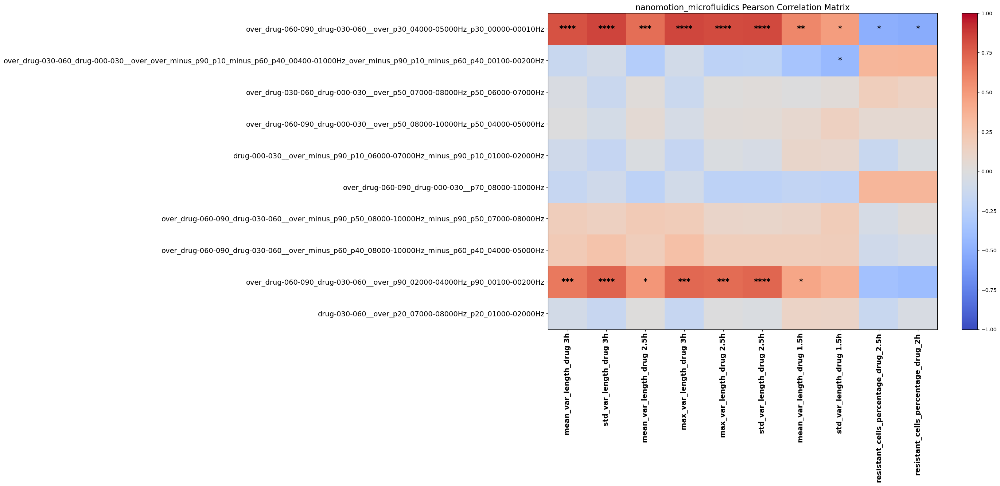

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


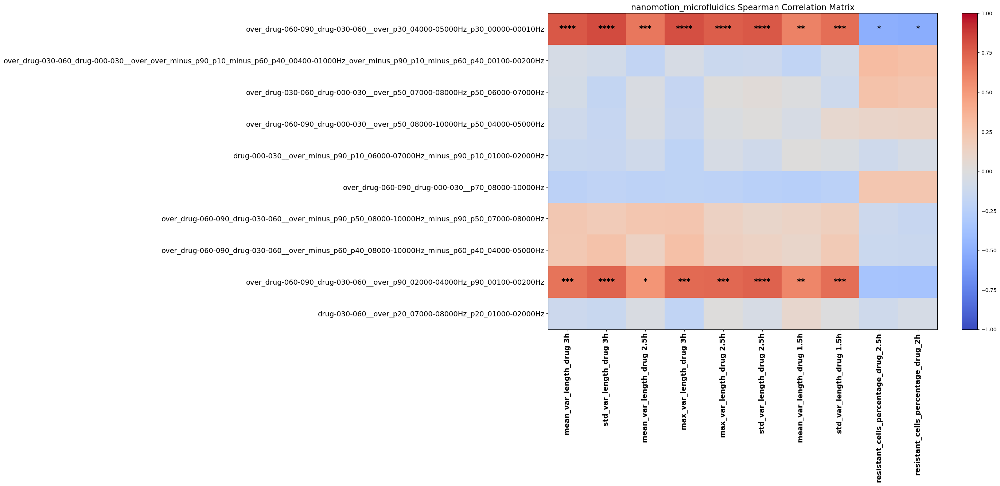

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


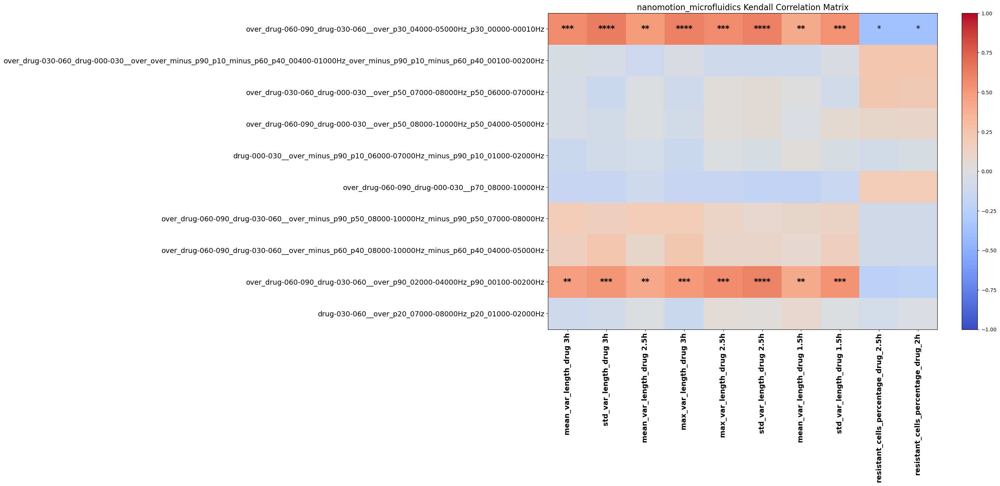

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [668]:
run_pairwise_analysis(
    df1 = nanomotion_triplet_mean, 
    df2 = microfluidics_features,
    output_pair= "nanomotion_microfluidics",
    base_output_folder = output_folder
);

In [669]:
nanomotion_triplet_mean

,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,over_drug-030-060_drug-000-030__over_over_minus_p90_p10_minus_p60_p40_00400-01000Hz_over_minus_p90_p10_minus_p60_p40_00100-00200Hz,over_drug-030-060_drug-000-030__over_p50_07000-08000Hz_p50_06000-07000Hz,over_drug-060-090_drug-000-030__over_p50_08000-10000Hz_p50_04000-05000Hz,drug-000-030__over_minus_p90_p10_06000-07000Hz_minus_p90_p10_01000-02000Hz,over_drug-060-090_drug-000-030__p70_08000-10000Hz,over_drug-060-090_drug-030-060__over_minus_p90_p50_08000-10000Hz_minus_p90_p50_07000-08000Hz,over_drug-060-090_drug-030-060__over_minus_p60_p40_08000-10000Hz_minus_p60_p40_04000-05000Hz,over_drug-060-090_drug-030-060__over_p90_02000-04000Hz_p90_00100-00200Hz,drug-030-060__over_p20_07000-08000Hz_p20_01000-02000Hz
0,0.523333,0.993333,1.000000,1.006667,6.340000,1.026667,1.000000,0.996667,0.846667,9.916667
1,0.583333,0.966667,1.000000,0.990000,6.236667,1.016667,0.990000,0.990000,0.630000,9.736667
2,0.850000,0.983333,1.000000,1.003333,5.483333,1.006667,1.000000,1.000000,0.756667,8.623333
3,0.660000,0.986667,1.000000,1.006667,6.620000,1.006667,1.000000,1.000000,0.810000,10.170000
4,0.983333,0.986667,1.000000,1.020000,6.040000,1.026667,1.000000,1.006667,1.050000,9.453333
5,1.266667,0.953333,1.000000,1.013333,5.990000,1.003333,0.996667,1.003333,1.070000,9.436667
6,1.500000,0.976667,1.000000,1.000000,6.013333,1.006667,0.996667,0.996667,1.196667,9.566667
7,1.040000,0.996667,1.000000,1.016667,5.656667,0.996667,1.000000,1.003333,1.210000,8.930000
8,1.533333,0.990000,1.020000,1.086667,6.026667,1.026667,1.006667,1.013333,1.150000,9.336667
9,1.826667,1.006667,1.000000,0.996667,5.140000,1.003333,0.996667,1.000000,1.413333,7.963333


In [670]:
# # calculate correlation significance
# from scipy.stats import pearsonr, spearmanr

# r, p = pearsonr(nanomotion_triplet_mean, microfluidics_features)
# print("Correlation:", r)
# print("p-value:", p)

# # If p is an array of p-values, iterate through it
# for value in p:
#     if value < 0.05:
#         print("significant")
#     else:
#         print("not significant")


In [671]:
# rho, p = spearmanr(nanomotion_triplet_mean, microfluidics_features)
# print("Spearman correlation:", rho)
# print("p-value:", p)

In [672]:
# prediction score vs MIC (from nanomotion)

In [673]:
# correlation between colony size... with features (frm drug free exoeriment) p-hacking

# Correlation with phenotypic features

In [674]:
df_phenotypic = pd.read_csv("/home/margaritisvoliotis/Documents/AMR classification model/251119_414_updated_phenotypic_data_from_Susanne_with_nanomotion_data_for_Marina.csv")


In [675]:
df_phenotypic


,strain,pangenome_name,c_di_GMP,OCR_value,Origin,Geographic_Origin,Supplier_Strain_collection,Infection_site_sample_material,Type_of_infection,TOB,...,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,over_drug-030-060_drug-000-030__over_over_minus_p90_p10_minus_p60_p40_00400-01000Hz_over_minus_p90_p10_minus_p60_p40_00100-00200Hz,over_drug-030-060_drug-000-030__over_p50_07000-08000Hz_p50_06000-07000Hz,over_drug-060-090_drug-000-030__over_p50_08000-10000Hz_p50_04000-05000Hz,drug-000-030__over_minus_p90_p10_06000-07000Hz_minus_p90_p10_01000-02000Hz,over_drug-060-090_drug-000-030__p70_08000-10000Hz,over_drug-060-090_drug-030-060__over_minus_p90_p50_08000-10000Hz_minus_p90_p50_07000-08000Hz,over_drug-060-090_drug-030-060__over_minus_p60_p40_08000-10000Hz_minus_p60_p40_04000-05000Hz,over_drug-060-090_drug-030-060__over_p90_02000-04000Hz_p90_00100-00200Hz,drug-030-060__over_p20_07000-08000Hz_p20_01000-02000Hz
0,CF592Iso2,CF592Iso2,NaN,NaN,University hospital Essen,Essen,University hospital Essen,Cystic fibrosis,respiratory tract,2.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
1,CF609Iso3,CF609Iso3,NaN,NaN,University hospital Essen,Essen,University hospital Essen,Cystic fibrosis,respiratory tract,8.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
2,CH2500,CH2500,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,tracheobronchial secretion,respiratory tract,0.5,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
3,CH2502,CH2502,NaN,392.459468,Charité Berlin,Berlin,Charité Berlin,nd/other,nd/other,4.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
4,CH2522,CH2522,NaN,377.147813,Charité Berlin,Berlin,Charité Berlin,rectal smear,rectal infection,2.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,ZG5089456,ZG5089456,NaN,NaN,Leipzig,nd,nd,sputum CF,respiratory tract,128.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
412,ZG8006959,ZG8006959,NaN,NaN,Leipzig,Leipzig,Leipzig,urinary tract (Chronic),urinary tract,128.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A
413,ZG8038581181,ZG8038581181,2.232354,274.264000,Chemnitz,Chemnitz,Chemnitz,tracheobronchial secretion,respiratory tract,1.0,...,0.244023479133575,0.879246703094965,1.00051304643862,0.984546952933177,6.21146228449466,0.993117850013412,0.991071150716751,0.99159477420656,0.400661069681982,9.46306376587931
414,ZG8510487,ZG8510487,2.932539,NaN,Leipzig,Leipzig,Leipzig,urinary tract,urinary tract,256.0,...,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A,=#N/A


In [676]:
# 1. Columns T–W and AC–AE
cols = list(df_phenotypic.columns[19:23]) + list(df_phenotypic.columns[28:31])

# 2. Filter and reorder rows by df_nanomotion['strain_name']
ordered = df_phenotypic.set_index('strain').loc[df['strain_name']]

# 3. Keep only the first row of every 3 rows (0, 3, 6, ...)
ordered = ordered.iloc[::3, :]

# 4. Add 'strain' as first column + selected phenotypic columns
final_cols = ['strain'] + cols

# 5. Final result
phenotypic = ordered.reset_index()[final_cols]


In [677]:
phenotypic

,strain,Colony_size_1_4,Margin_0_1_2,Surface_0_1_2,Metallic_0_1_2,Swimming,Swarming,BF_formation_clusters
0,CH5528,1.0,0.0,0.0,2.0,0.000000,0.000000,N
1,MHH14929,2.0,2.0,0.0,2.0,1.283602,0.916599,N
2,MHH17783,0.0,0.0,0.0,1.0,0.969388,0.000000,NaN
3,CH4780,0.0,0.0,1.0,0.0,0.000000,0.000000,N
4,F2119,1.0,1.0,0.0,1.0,0.446898,0.000000,E
5,PSAE2125,2.0,1.0,0.0,0.0,0.465373,0.105601,NaN
6,ZG302359,1.0,1.0,1.0,0.0,0.755764,0.480946,D
7,CH2730,1.0,0.0,0.0,1.0,0.769701,0.329430,A
8,CH4520,2.0,1.0,0.0,1.0,1.203841,3.453163,A
9,CH5353,2.0,1.0,1.0,0.0,0.940316,3.375618,N


In [678]:
cols = [c for c in phenotypic.columns if c not in ['strain', 'BF_formation_clusters']]

phenotypic = phenotypic[cols]


In [679]:
phenotypic

,Colony_size_1_4,Margin_0_1_2,Surface_0_1_2,Metallic_0_1_2,Swimming,Swarming
0,1.0,0.0,0.0,2.0,0.000000,0.000000
1,2.0,2.0,0.0,2.0,1.283602,0.916599
2,0.0,0.0,0.0,1.0,0.969388,0.000000
3,0.0,0.0,1.0,0.0,0.000000,0.000000
4,1.0,1.0,0.0,1.0,0.446898,0.000000
5,2.0,1.0,0.0,0.0,0.465373,0.105601
6,1.0,1.0,1.0,0.0,0.755764,0.480946
7,1.0,0.0,0.0,1.0,0.769701,0.329430
8,2.0,1.0,0.0,1.0,1.203841,3.453163
9,2.0,1.0,1.0,0.0,0.940316,3.375618


## Colony characteristics

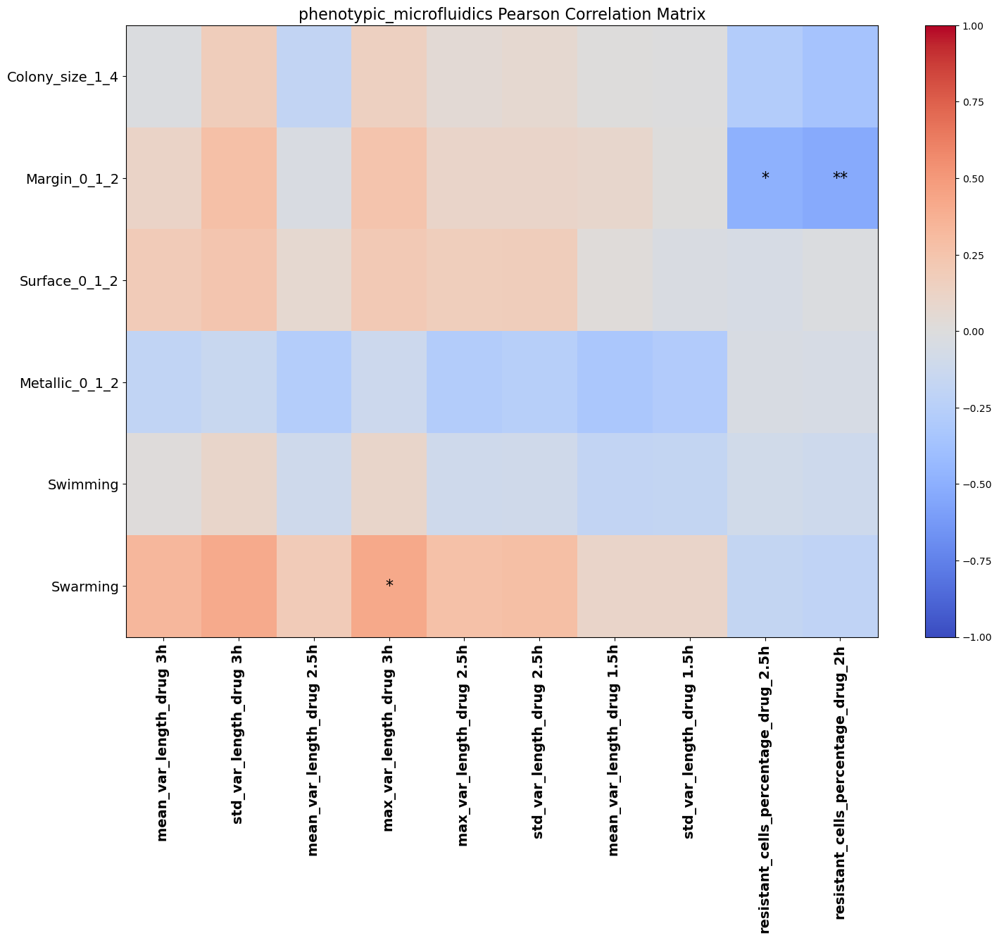

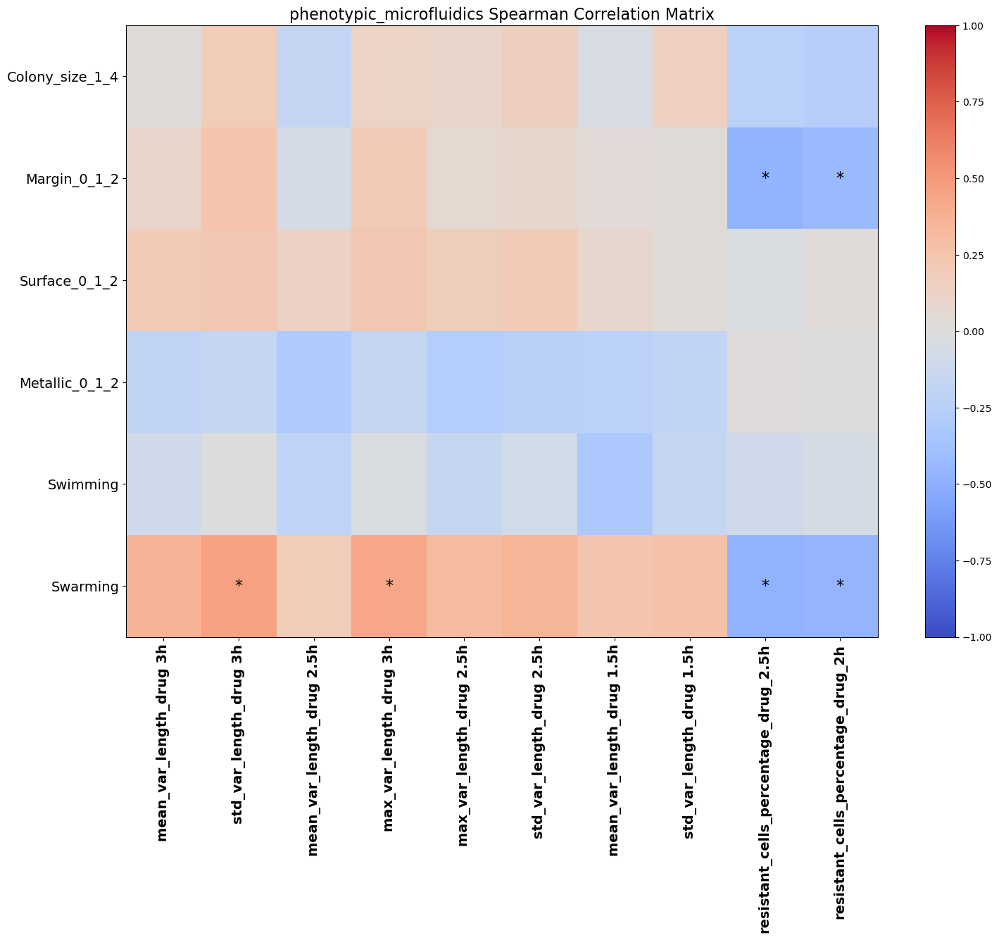

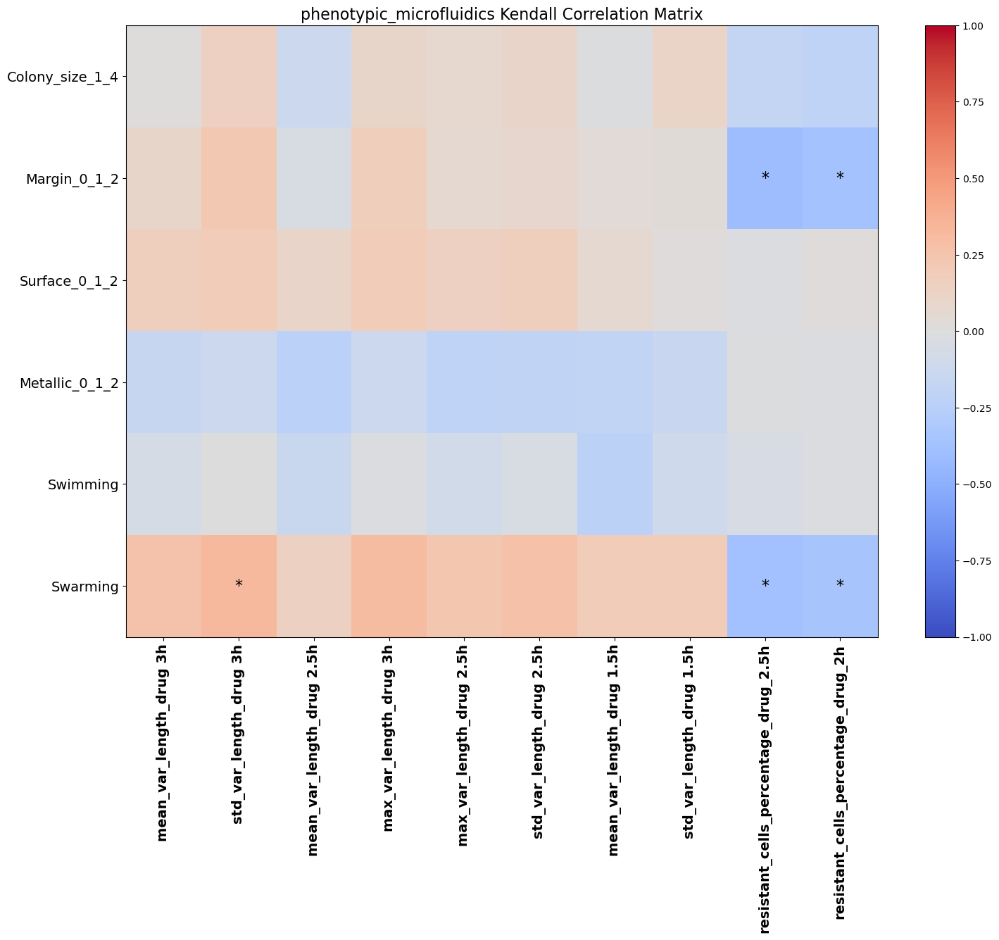

In [680]:
run_pairwise_analysis(
    df1 = phenotypic, 
    df2 = microfluidics_features,
    output_pair= "phenotypic_microfluidics",
    base_output_folder = output_folder
);

# MIC 

In [681]:
# 2. Filter and reorder rows by df_nanomotion['strain_name']
ordered = df_phenotypic.set_index('strain').loc[df['strain_name']]

# 3. Keep only the first row of every 3 rows (0, 3, 6, ...)
ordered = ordered.iloc[::3, :]


# 4. Add 'strain' as first column + selected phenotypic columns
final_cols = ['CIP']

# 5. Final result
mic = ordered.reset_index()[final_cols]

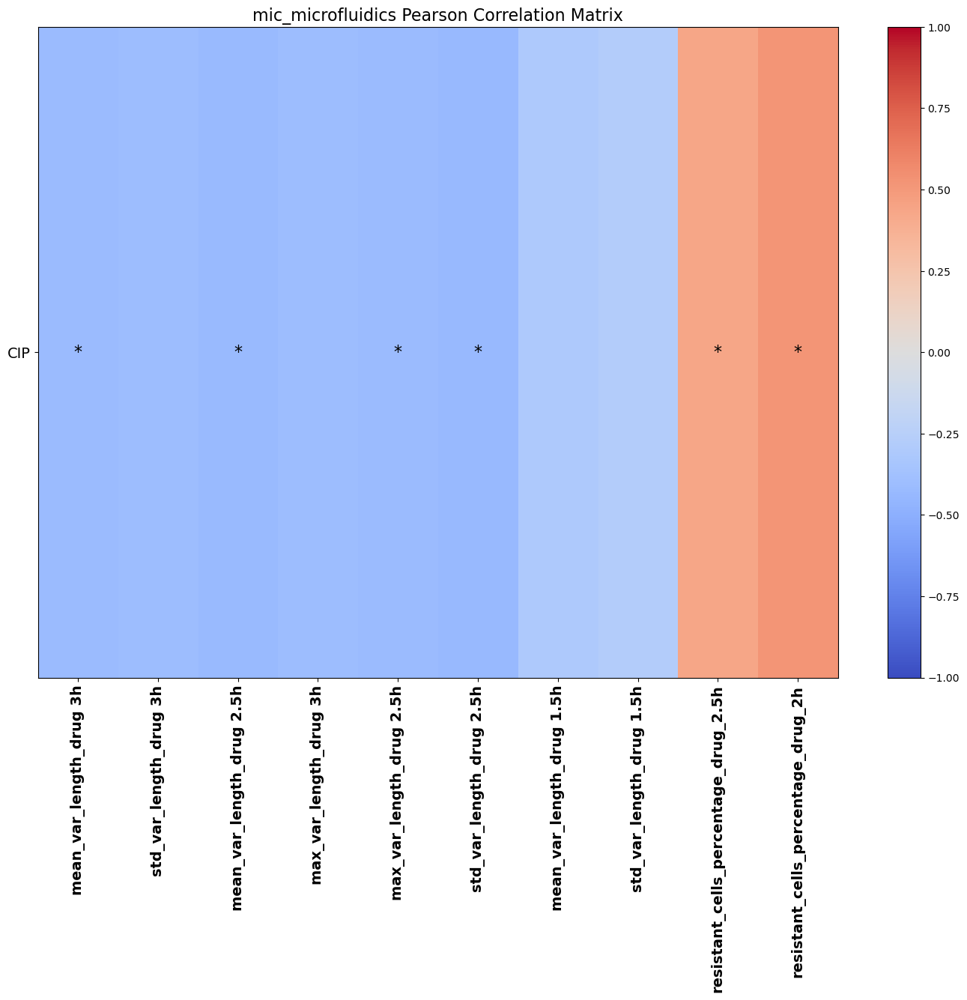

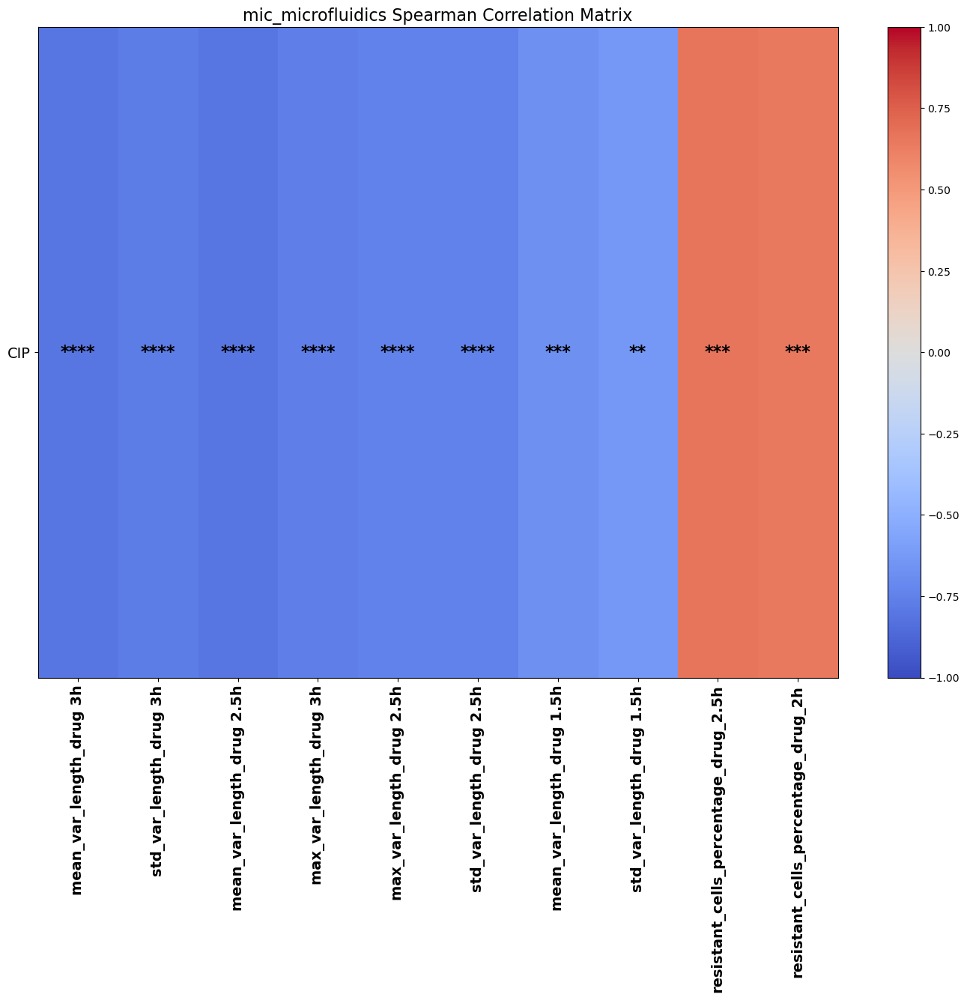

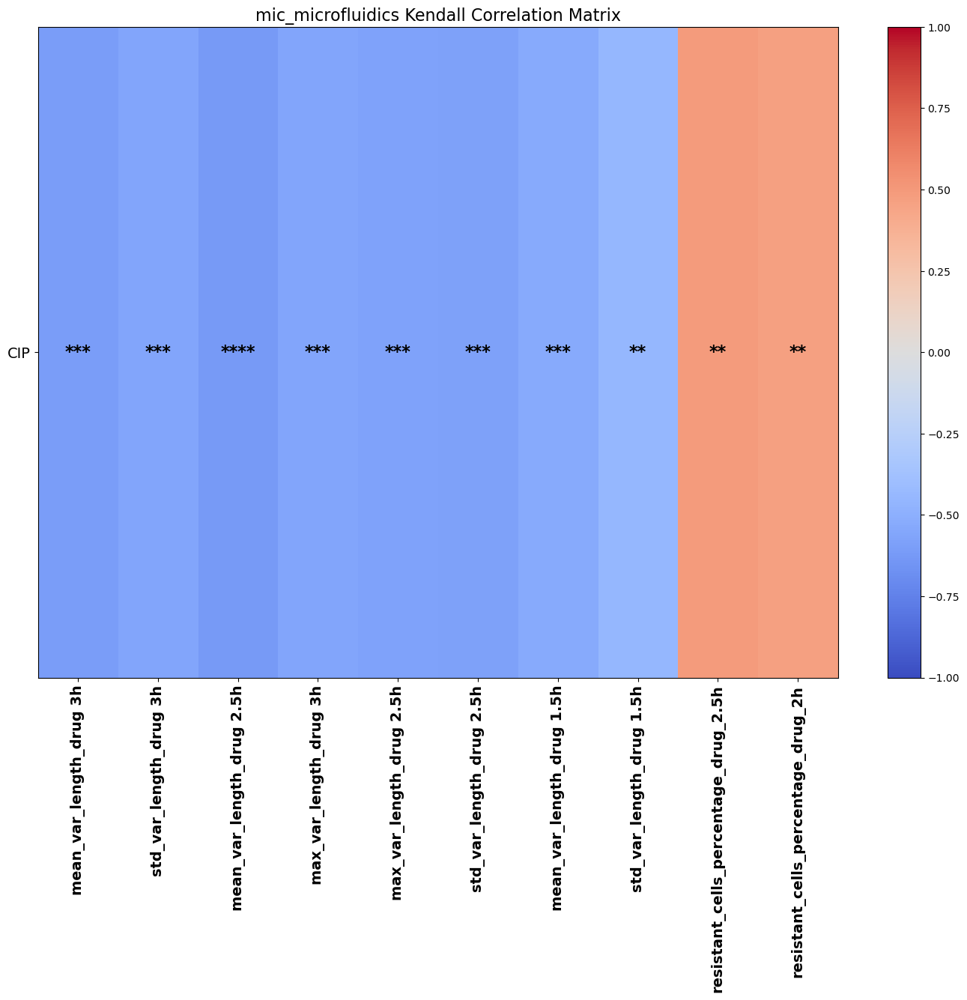

In [682]:
run_pairwise_analysis(
    df1 = mic, 
    df2 = microfluidics_features,
    output_pair= "mic_microfluidics",
    base_output_folder = output_folder
);

# Virulence

In [683]:
# 2. Filter and reorder rows by df_nanomotion['strain_name']
ordered = df_phenotypic.set_index('strain').loc[df['strain_name']]

# 3. Keep only the first of every 3 duplicate rows
ordered = ordered.iloc[::3, :]

# 4. Select columns X–Z (0-indexed positions 23, 24, 25)
final_cols = [23, 24, 25]

# 5. Extract these columns correctly
virulence = ordered.reset_index().iloc[:, final_cols]


In [684]:
virulence

,Hemolysis_0_1_2,Survival_24,Survival_48
0,0.0,95.000000,85.000000
1,1.0,80.000000,5.000000
2,0.0,NaN,NaN
3,2.0,100.000000,60.000000
4,1.0,NaN,NaN
5,2.0,95.000000,85.000000
6,2.0,0.000000,0.000000
7,1.0,95.000000,75.000000
8,1.0,13.333333,3.333333
9,2.0,0.000000,0.000000


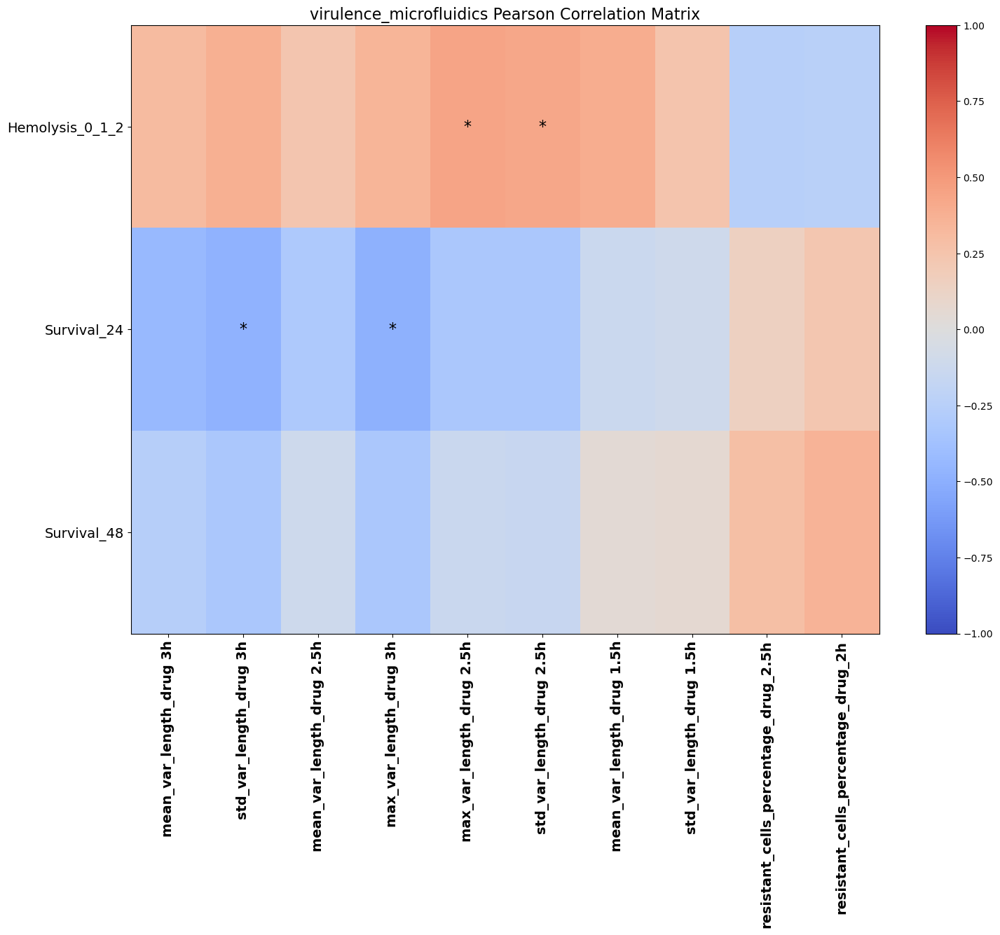

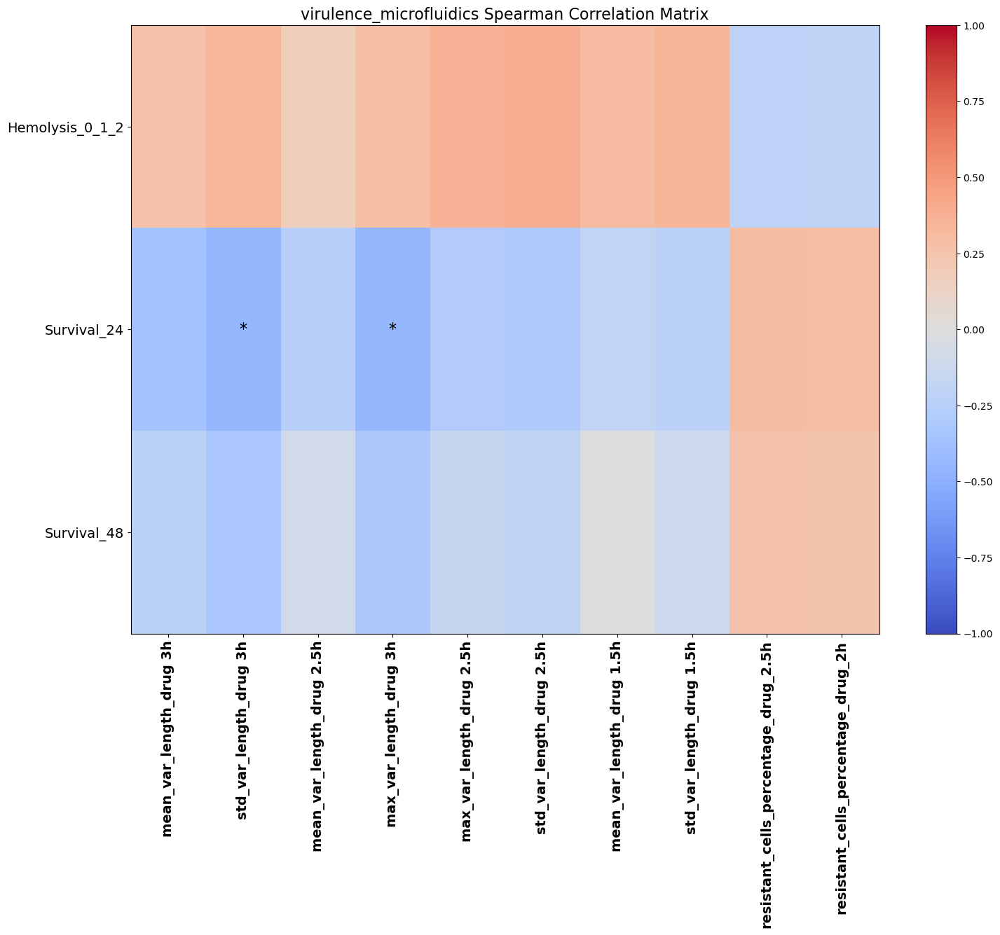

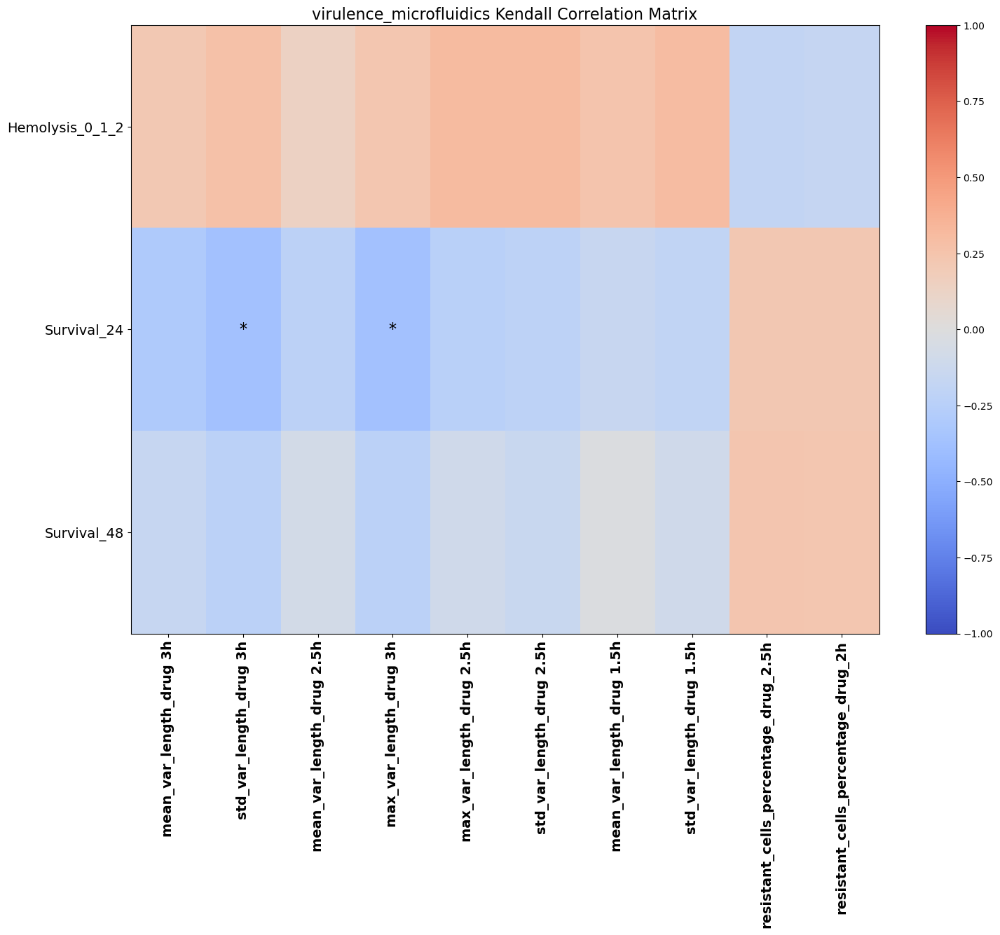

In [685]:
run_pairwise_analysis(
    df1 = virulence, 
    df2 = microfluidics_features,
    output_pair= "virulence_microfluidics",
    base_output_folder = output_folder
);

# Imunne response

In [686]:
def col_letter_to_index(col):
    """Convert Excel column letters to 0-indexed column index."""
    col = col.upper()
    num = 0
    for c in col:
        num = num * 26 + (ord(c) - ord('A') + 1)
    return num - 1   # convert to 0-indexed


In [687]:
# Filter and reorder rows by df['strain_name']
ordered = df_phenotypic.set_index('strain').loc[df['strain_name']]

# Keep only first of every 3 duplicates
ordered = ordered.iloc[::3, :]
start = col_letter_to_index("AI")   # inclusive
end   = col_letter_to_index("BD")   # inclusive

immune_response = ordered.reset_index().iloc[:, start : end + 1]


In [688]:
start = col_letter_to_index("AI")   # inclusive
end   = col_letter_to_index("BD")   # inclusive

immune_response = ordered.reset_index().iloc[:, start : end + 1]


In [689]:

# immune_response

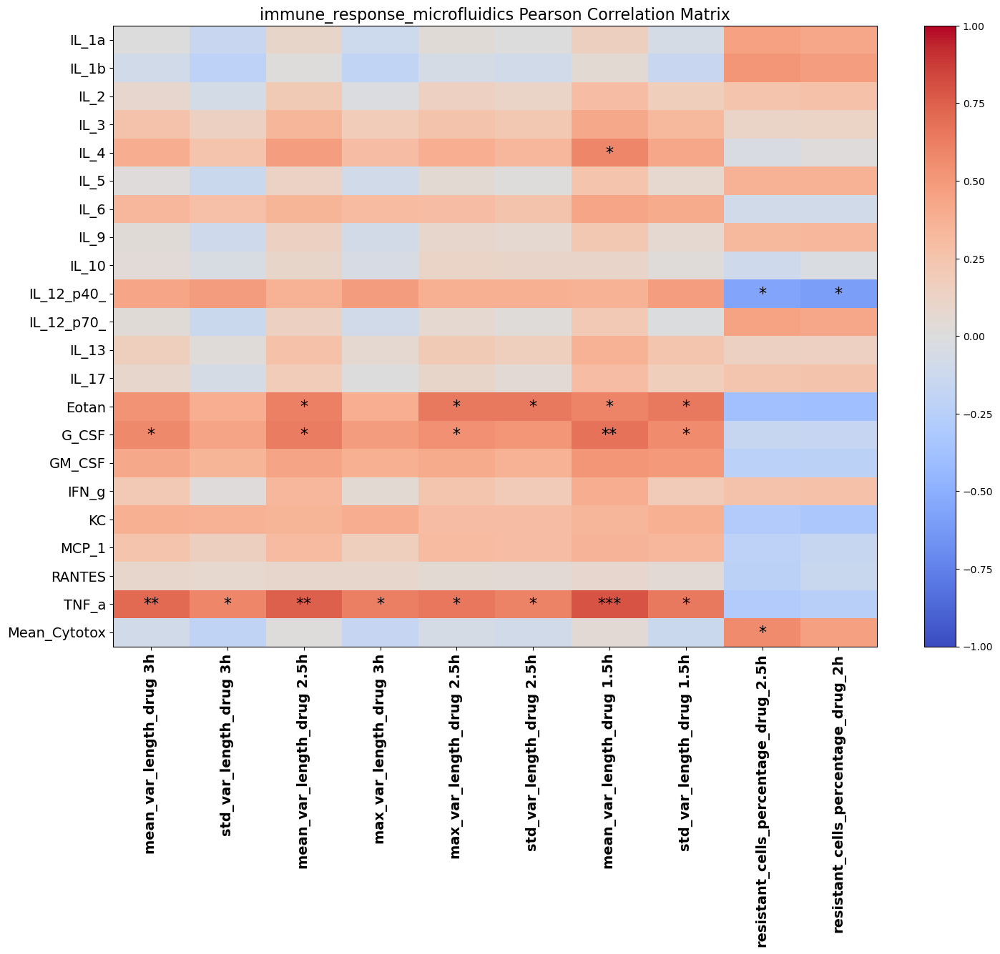

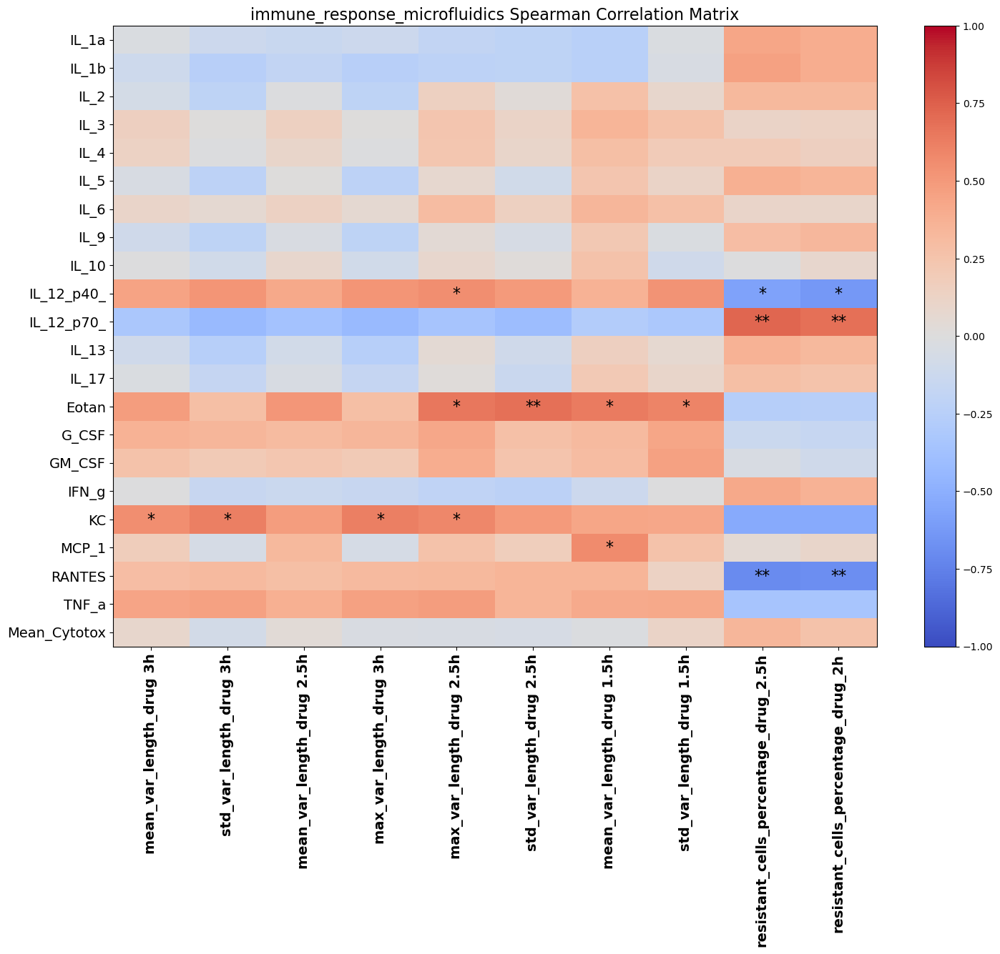

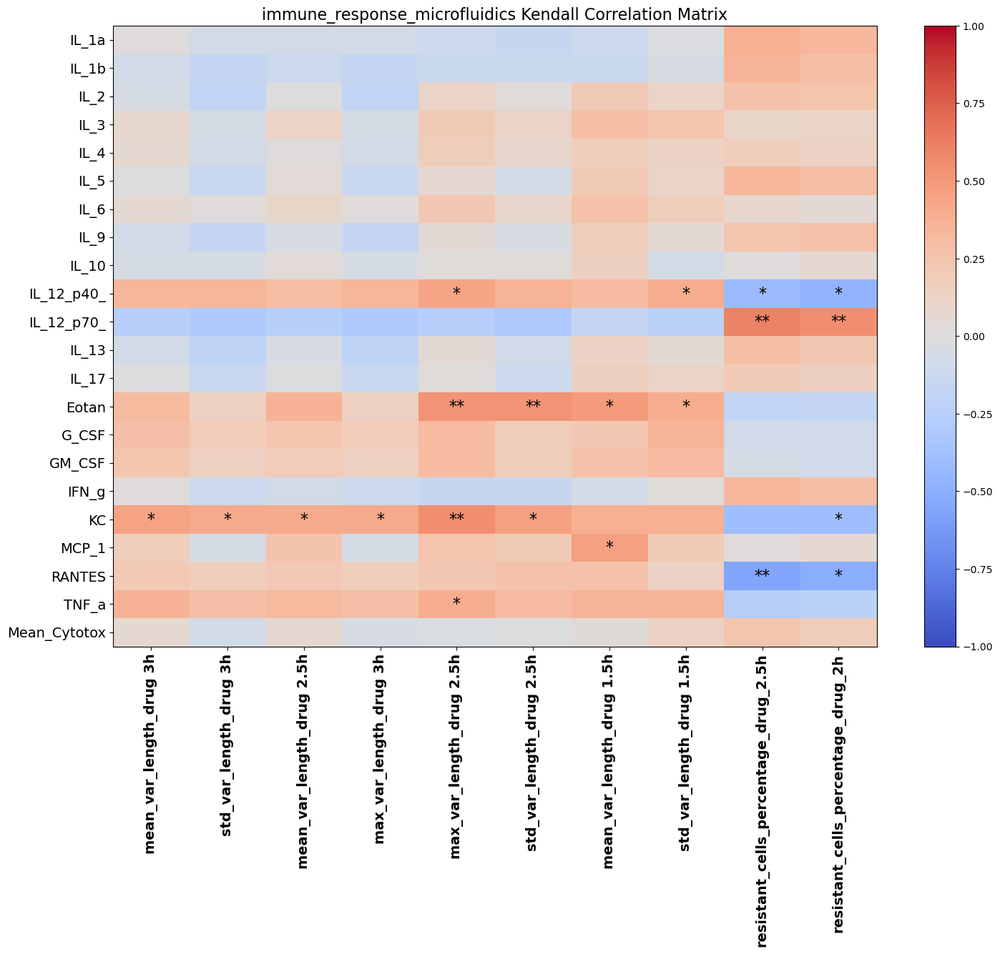

In [690]:
run_pairwise_analysis(
    df1 = immune_response, 
    df2 = microfluidics_features,
    output_pair= "immune_response_microfluidics",
    base_output_folder = output_folder
);


# Doubling time

In [691]:
# Doubling times
start = col_letter_to_index("BQ")
end   = col_letter_to_index("BR")


# Filter and reorder rows by df['strain_name']
ordered = df_phenotypic.set_index('strain').loc[df['strain_name']]

# Keep only first of every 3 duplicates
ordered = ordered.iloc[::3, :]


doubling_time = ordered.reset_index().iloc[:, start : end + 1]

In [692]:
doubling_time

,doubling_time,doubling_time_var
0,48.559,6.545
1,24.665,3.529
2,66.177,41.449
3,50.809,7.873
4,27.087,5.224
5,46.484,23.134
6,35.572,6.874
7,37.172,5.317
8,25.214,2.122
9,27.408,4.829


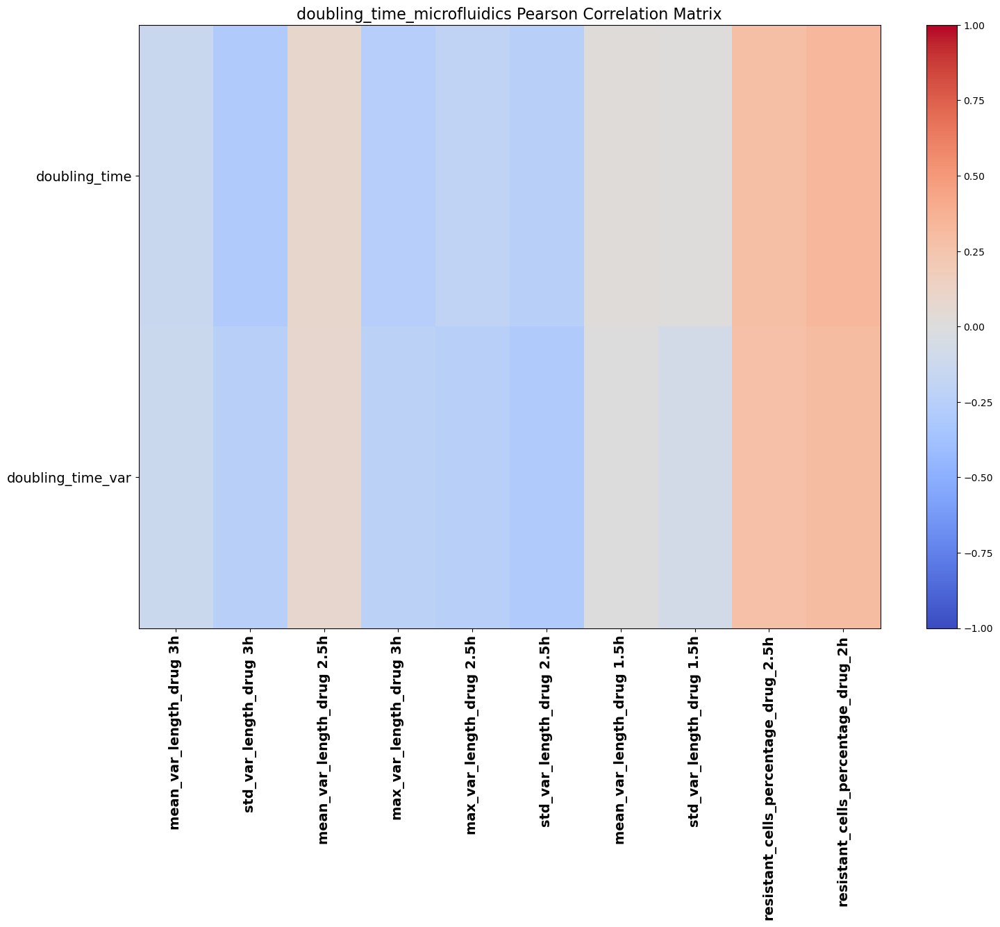

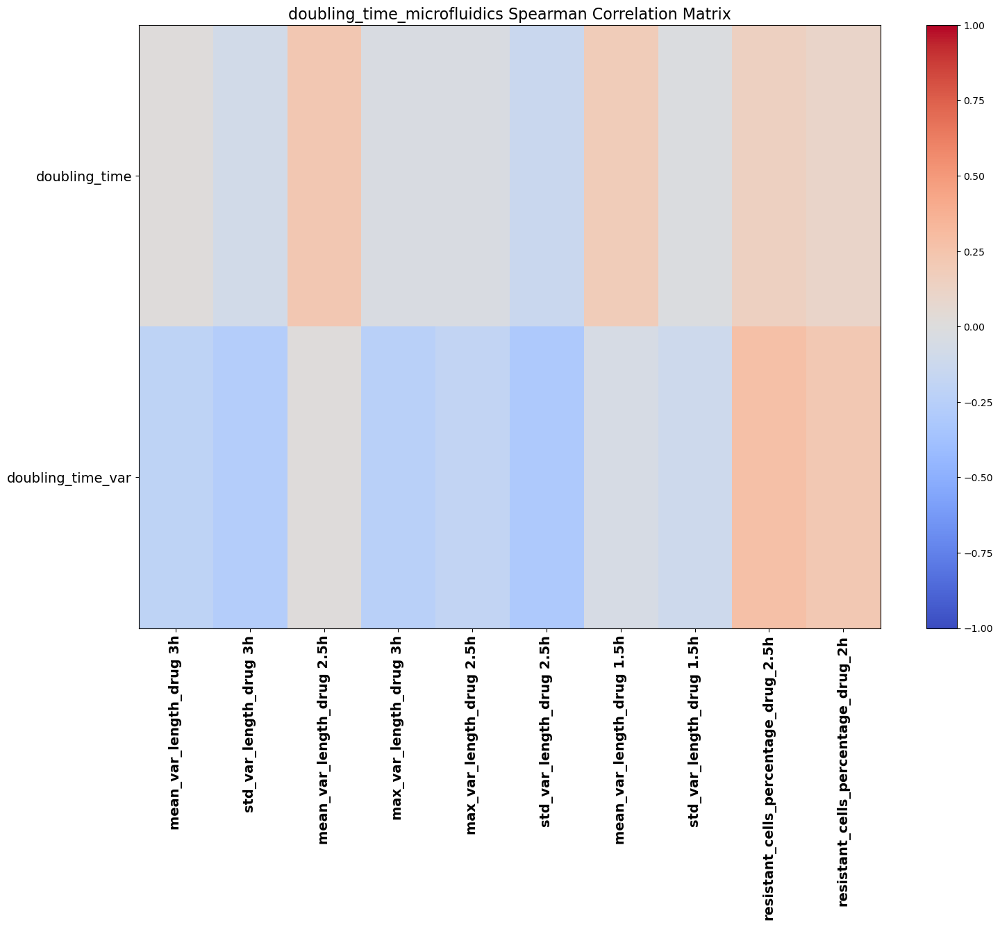

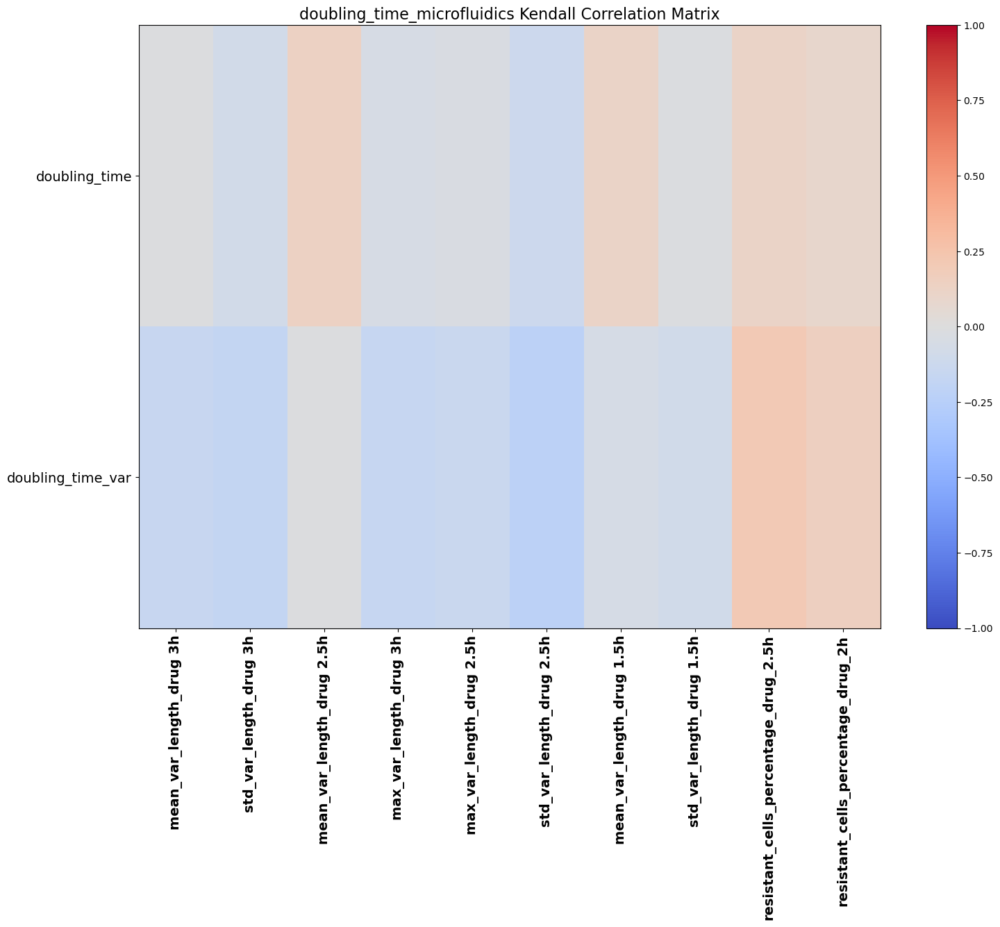

In [693]:
run_pairwise_analysis(
    df1 = doubling_time, 
    df2 = microfluidics_features,
    output_pair= "doubling_time_microfluidics",
    base_output_folder = output_folder
);

In [694]:
# #Please find in attachment the explanatory document that I was sent by prof Susanne Haussler.

# Please do have a look at her google scholar page too and in particular at the papers on BACTOME which is the name they gave to these P. Aeruginosa collection.

In [695]:
# Doubling time (columns BQ-BR) vs the nanomotion features (BS-CD)
# Immune response (columns AI-BD) vs the nanomotion features (BS-CD)
# Phenotype (columns T-W and AC-AE) vs the nanomotion features (BS-CD)
# CIP (column L) vs the nanomotion features (BS-CD)
# Virulence (columns X-Z) vs the nanomotion features (BS-CD)

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


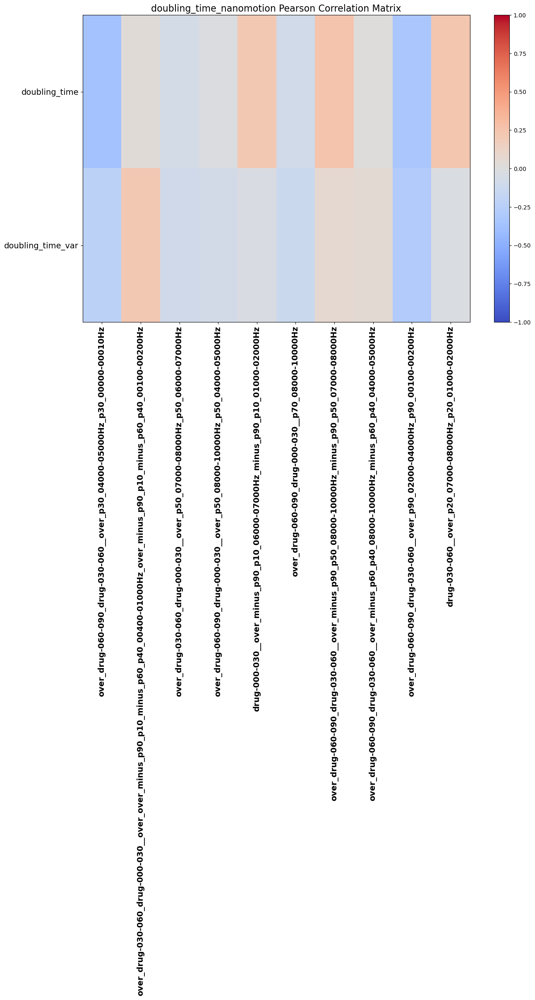

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


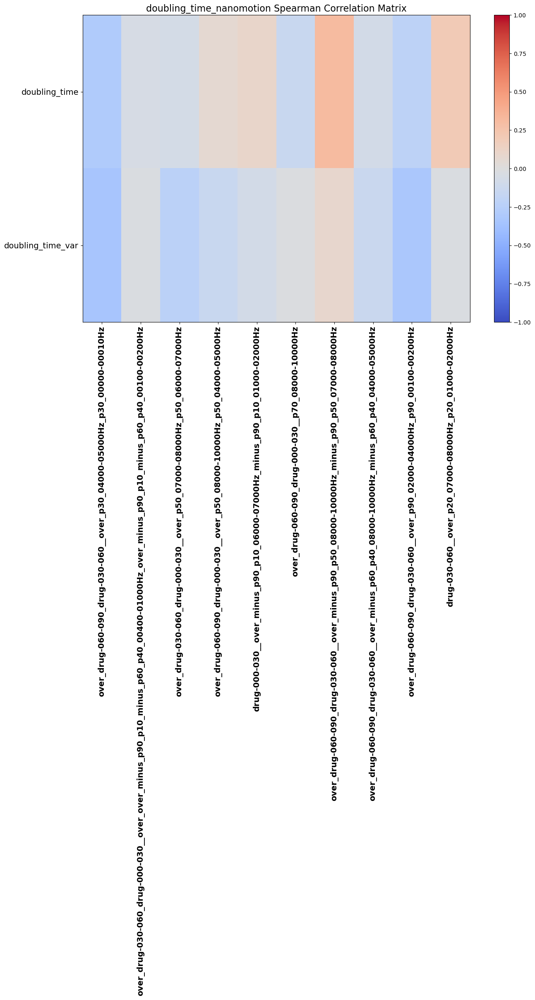

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


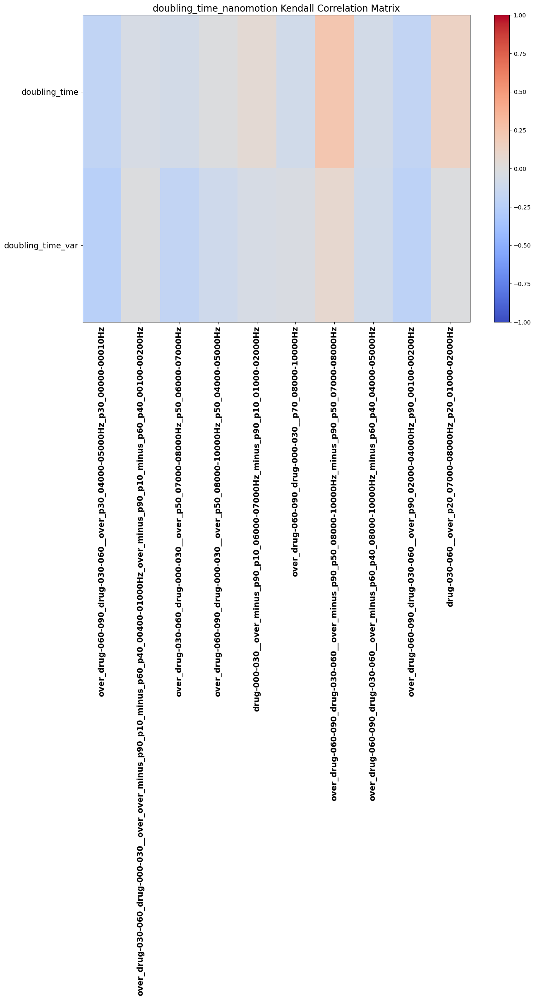

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [696]:
run_pairwise_analysis(
    df1 = doubling_time, 
    df2 = nanomotion_triplet_mean,
    output_pair= "doubling_time_nanomotion",
    base_output_folder = output_folder
);

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


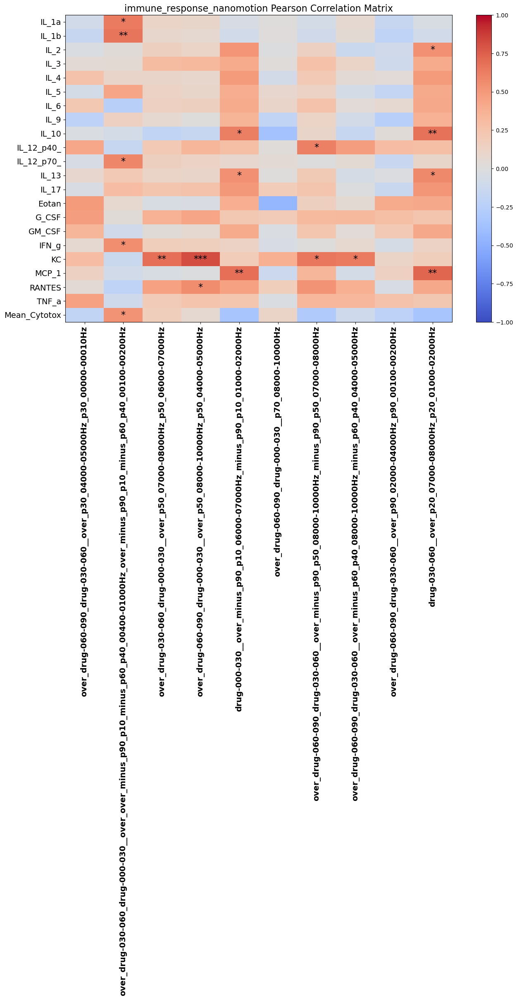

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


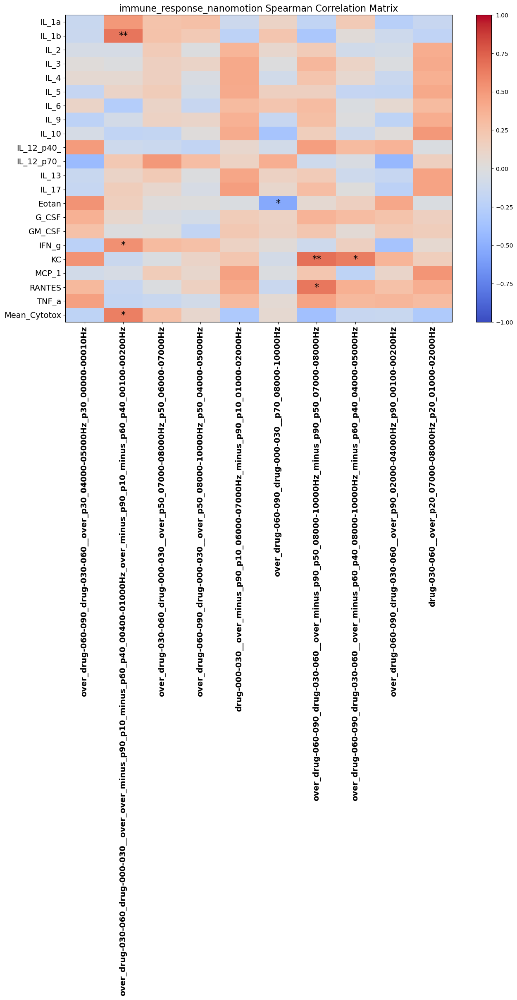

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


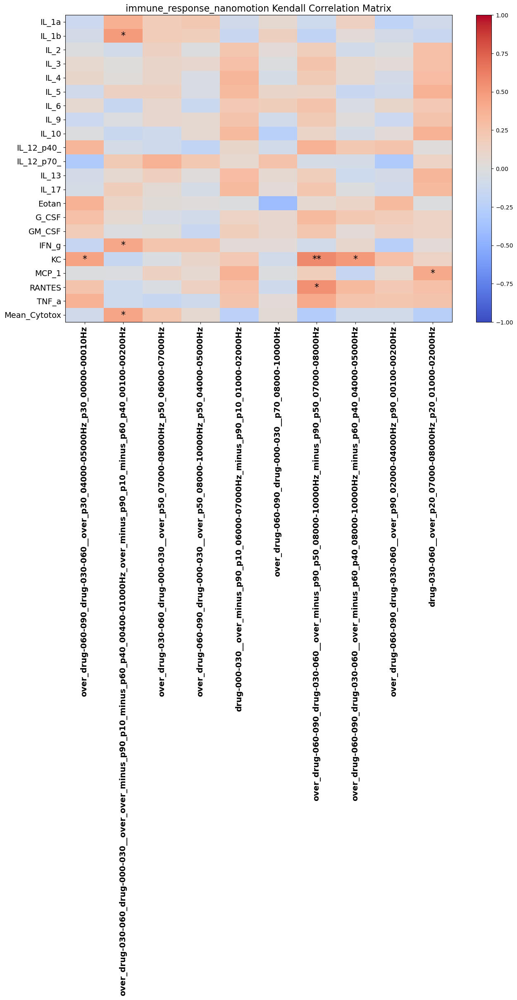

In [697]:
run_pairwise_analysis(
    df1 = immune_response, 
    df2 = nanomotion_triplet_mean,
    output_pair= "immune_response_nanomotion",
    base_output_folder = output_folder
);

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


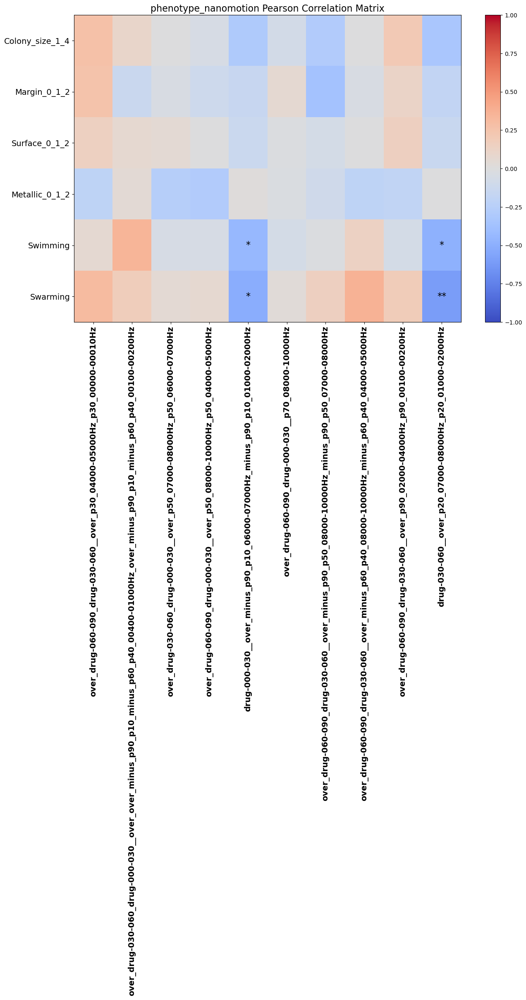

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


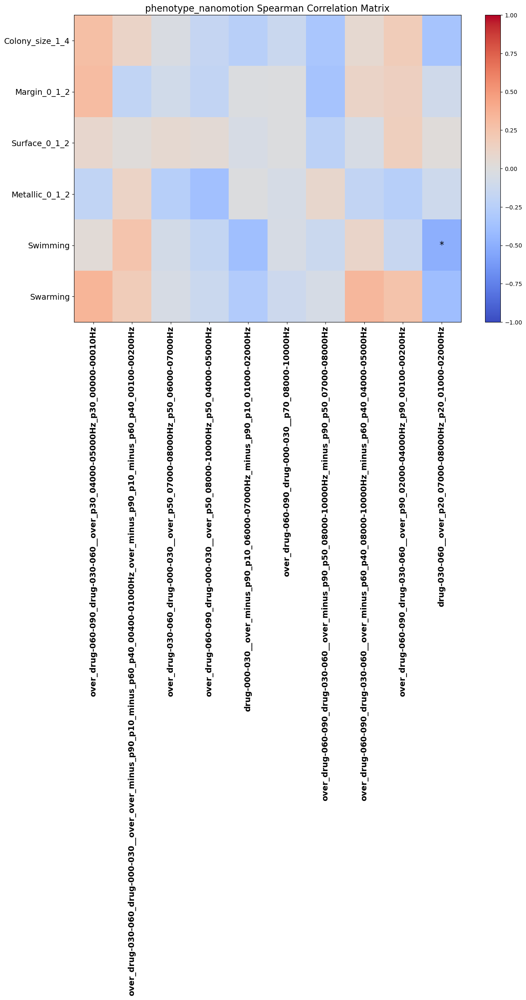

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


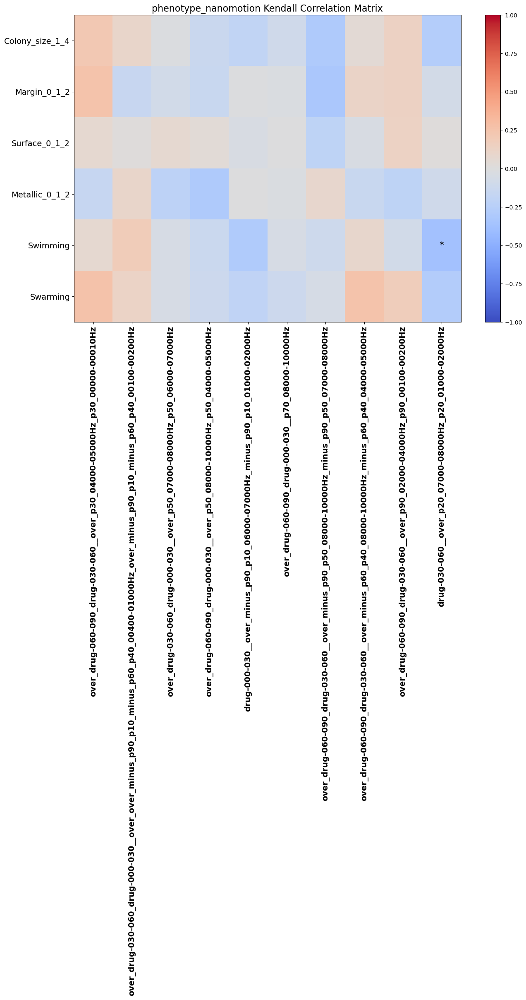

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [698]:
run_pairwise_analysis(
    df1 = phenotypic, 
    df2 = nanomotion_triplet_mean,
    output_pair= "phenotype_nanomotion",
    base_output_folder = output_folder
);

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


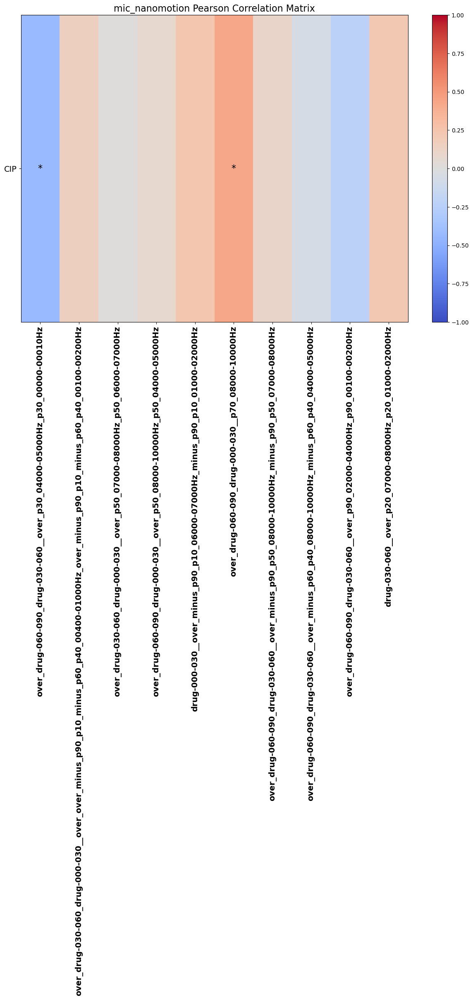

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


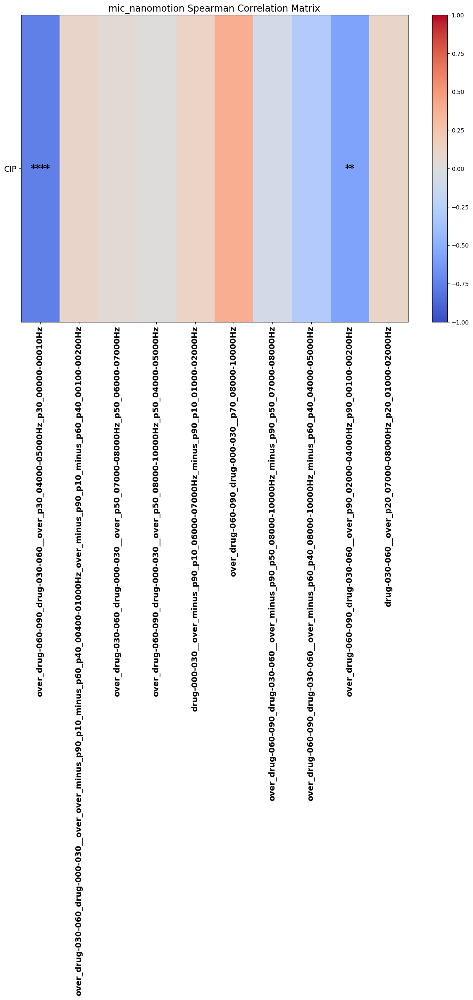

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


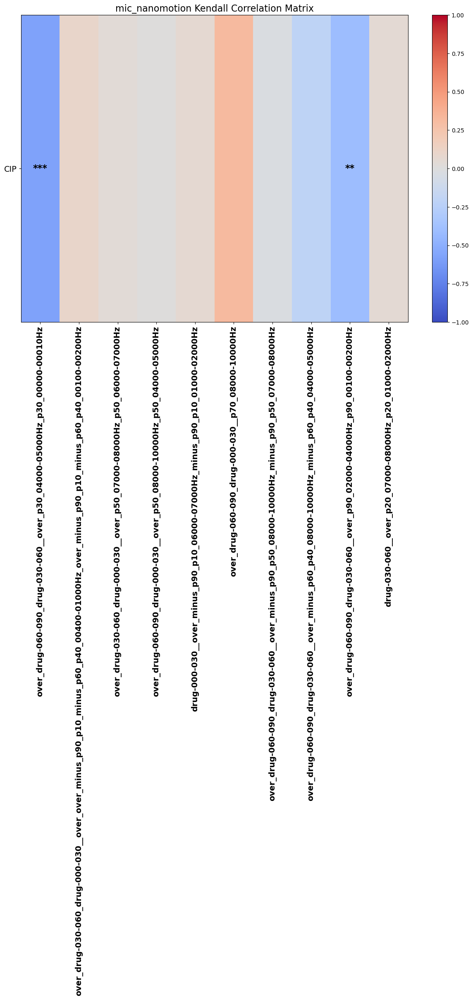

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [699]:
run_pairwise_analysis(
    df1 = mic, 
    df2 = nanomotion_triplet_mean,
    output_pair= "mic_nanomotion",
    base_output_folder = output_folder
);

/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


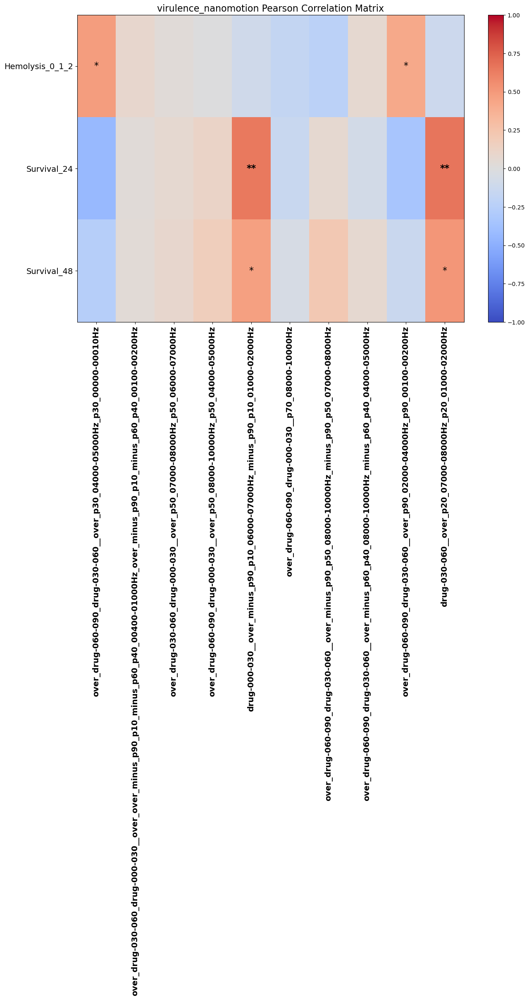

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


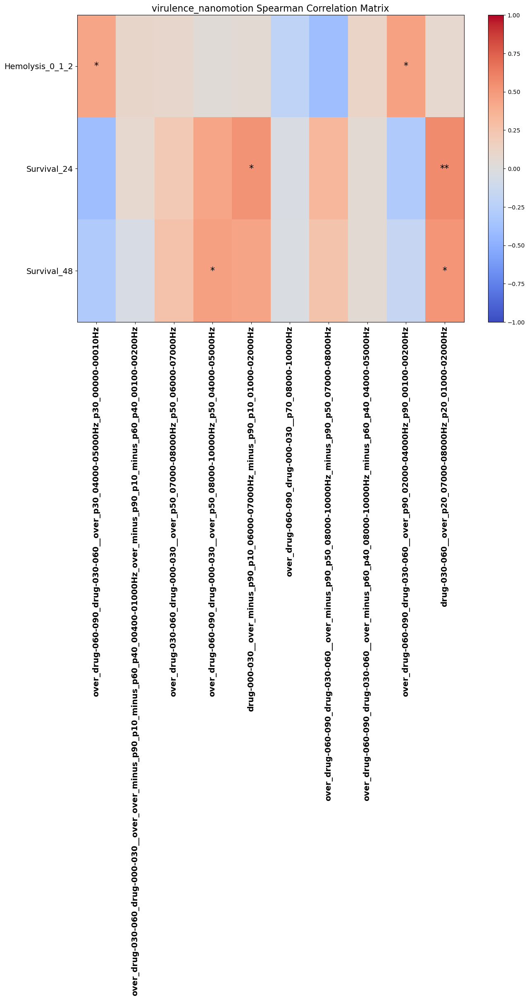

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/2274598592.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


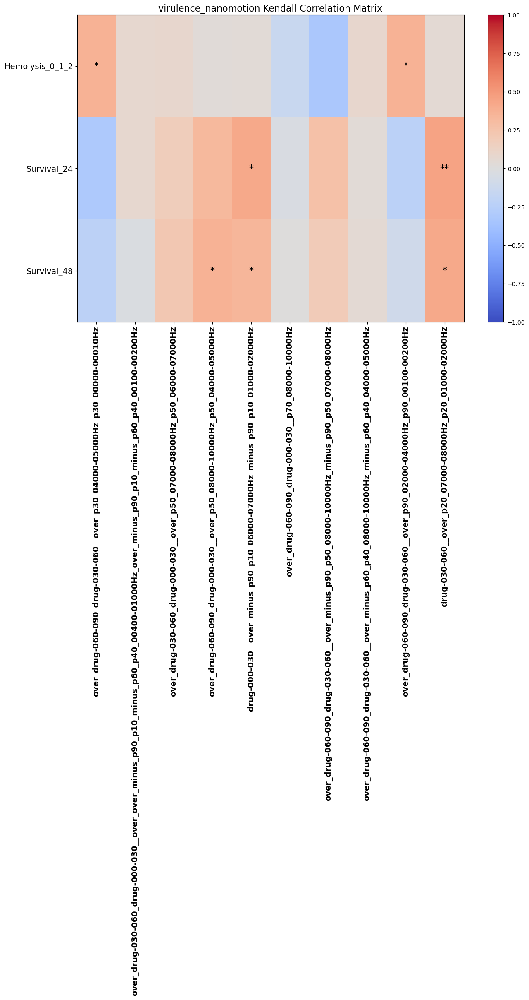

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [700]:
run_pairwise_analysis(
    df1 = virulence, 
    df2 = nanomotion_triplet_mean,
    output_pair= "virulence_nanomotion",
    base_output_folder = output_folder
);

In [701]:
# If simple enough, I suggest you perform these correlations twice: 
#1) only for the isolates for which we have microscopy data (so same set that you already used), 
#2) for all the isolates for which there are nanomotion data.

# All nanomotion isolates

In [702]:
# Assume
# df_phenotypic has a column "strain"
# df_strains has a column "strain_name"

df_phenotypic_all_isolates = df_phenotypic[df_phenotypic["strain"].isin(df["strain_name"])]


In [703]:
df_phenotypic_all_isolates = df_phenotypic_all_isolates .reset_index(drop=True)


In [704]:
df_phenotypic_all_isolates 

,strain,pangenome_name,c_di_GMP,OCR_value,Origin,Geographic_Origin,Supplier_Strain_collection,Infection_site_sample_material,Type_of_infection,TOB,...,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,over_drug-030-060_drug-000-030__over_over_minus_p90_p10_minus_p60_p40_00400-01000Hz_over_minus_p90_p10_minus_p60_p40_00100-00200Hz,over_drug-030-060_drug-000-030__over_p50_07000-08000Hz_p50_06000-07000Hz,over_drug-060-090_drug-000-030__over_p50_08000-10000Hz_p50_04000-05000Hz,drug-000-030__over_minus_p90_p10_06000-07000Hz_minus_p90_p10_01000-02000Hz,over_drug-060-090_drug-000-030__p70_08000-10000Hz,over_drug-060-090_drug-030-060__over_minus_p90_p50_08000-10000Hz_minus_p90_p50_07000-08000Hz,over_drug-060-090_drug-030-060__over_minus_p60_p40_08000-10000Hz_minus_p60_p40_04000-05000Hz,over_drug-060-090_drug-030-060__over_p90_02000-04000Hz_p90_00100-00200Hz,drug-030-060__over_p20_07000-08000Hz_p20_01000-02000Hz
0,CH2730,CH2730,NaN,811.462000,Charité Berlin,Berlin,Charité Berlin,rectal smear,rectal infection,0.25,...,0.922053488005022,0.986455971450052,1.00070367395594,1.01129632030473,5.62669034409097,1.00357952980934,1.00114230949361,1.00203490997888,1.03932999126252,8.76153260061055
1,CH2939,CH2939,NaN,165.214450,Charité Berlin,Berlin,Charité Berlin,urinary tract,urinary tract,2.00,...,1.28390264227433,1.00223429944113,0.975912411840181,0.934072257202815,4.78001909093642,0.969011124130223,1.00275275556284,1.00075626237457,0.970801630742351,6.25675344515044
2,CH4520,CH4520,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,tracheobronchial secretion,respiratory tract,0.50,...,1.31064803766206,0.967781686098075,1.05334684478732,1.22176607353429,5.50524959126505,1.05285535495298,1.02425893173378,1.03972645864807,1.0741639158268,8.02439559076893
3,CH4591,CH4591,3.628038,236.954503,Charité Berlin,Berlin,Charité Berlin,rectal smear,rectal infection,0.50,...,1.07784150476908,1.00672998896184,1.00373731768029,1.01349675803232,5.30660439281747,1.01784366558313,1.0022638040726,0.998390728227694,1.06031428077384,8.40170886204159
4,CH4780,CH4780,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,tracheobronchial secretion,respiratory tract,2.00,...,0.4407205034162,0.930702142482979,0.998318863665693,0.997800200174279,6.26719340778616,0.999171482192939,0.997356100796574,1.00038535727599,0.707922584849437,9.59283003015601
5,CH4916,CH4916reseq,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,tracheobronchial secretion,respiratory tract,0.25,...,1.03393844215494,0.916531213379639,1.00233319158117,1.0120204183077,5.63232612863428,1.01002327111236,1.00071817870932,1.00224253423707,1.06561473767288,8.88836878832065
6,CH5267,CH5267reseq,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,rectal smear,rectal infection,0.50,...,3.21879943358929,1.0958063976763,0.947354463136949,0.873056557835691,3.82593062910588,0.999227060815341,1.00719965136885,1.01990698333573,2.83222323023089,6.02412526449513
7,CH5291,CH5291,NaN,289.053000,Charité Berlin,Berlin,Charité Berlin,rectal smear,rectal infection,1.00,...,1.0788066788448,0.964946111292938,1.00431202368179,1.00970324114778,5.74866963745899,1.00083793815278,1.00079645420672,1.00194990399912,0.992959223136999,9.15812528283006
8,CH5353,CH5353,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,rectal smear,rectal infection,0.50,...,1.54377590371124,1.03039314742741,0.9956917514239,0.996780892960086,4.73947815427236,0.999181037079083,1.00101478773602,1.00559924610305,1.48979692955483,7.10234985544704
9,CH5528,CH5528,NaN,NaN,Charité Berlin,Berlin,Charité Berlin,ear canal,ear infection,1.00,...,0.272973322613841,1.02597475119574,1.00210065992641,1.01358344506167,6.29006183782248,1.01225218563641,0.999587548809572,0.999162367824632,0.524810562845591,10.0224806169863


In [705]:
nanomotion_features

,over_drug-060-090_drug-030-060__over_p30_04000-05000Hz_p30_00000-00010Hz,over_drug-030-060_drug-000-030__over_over_minus_p90_p10_minus_p60_p40_00400-01000Hz_over_minus_p90_p10_minus_p60_p40_00100-00200Hz,over_drug-030-060_drug-000-030__over_p50_07000-08000Hz_p50_06000-07000Hz,over_drug-060-090_drug-000-030__over_p50_08000-10000Hz_p50_04000-05000Hz,drug-000-030__over_minus_p90_p10_06000-07000Hz_minus_p90_p10_01000-02000Hz,over_drug-060-090_drug-000-030__p70_08000-10000Hz,over_drug-060-090_drug-030-060__over_minus_p90_p50_08000-10000Hz_minus_p90_p50_07000-08000Hz,over_drug-060-090_drug-030-060__over_minus_p60_p40_08000-10000Hz_minus_p60_p40_04000-05000Hz,over_drug-060-090_drug-030-060__over_p90_02000-04000Hz_p90_00100-00200Hz,drug-030-060__over_p20_07000-08000Hz_p20_01000-02000Hz
0,0.27,1.03,1.00,1.01,6.29,1.01,1.00,1.00,0.52,10.02
1,0.80,0.97,1.00,1.00,6.28,1.06,1.00,0.99,0.82,9.84
2,0.50,0.98,1.00,1.01,6.45,1.01,1.00,1.00,1.20,9.89
3,0.59,0.94,1.00,0.98,6.09,1.00,0.99,0.99,0.63,9.45
4,0.54,0.98,1.00,0.98,6.13,1.04,0.98,0.98,0.50,9.31
...,...,...,...,...,...,...,...,...,...,...
64,1.26,1.01,1.01,1.02,5.67,1.02,1.00,1.01,1.10,8.98
65,0.52,0.96,1.00,1.00,6.05,1.00,1.00,0.99,0.59,9.57
66,0.79,1.09,1.00,1.02,5.52,1.01,1.00,1.01,0.92,8.73
67,0.59,0.88,1.00,1.00,5.65,1.01,1.00,1.00,0.79,8.76


In [706]:
# Keep only matching strains first
phenotypic_filtered_df = df_phenotypic[df_phenotypic["strain"].isin(df["strain_name"])]

# Reorder to match df_strains
phenotypic_ordered_df = phenotypic_filtered_df.set_index("strain").loc[df["strain_name"]].reset_index()


# 1. Columns T–W and AC–AE
cols = list(df_phenotypic.columns[19:23]) + list(df_phenotypic.columns[28:31])

# 2. Filter and reorder rows by df_nanomotion['strain_name']
#ordered = df_phenotypic.set_index('strain').loc[df['strain_name']]

# 3. Keep only the first row of every 3 rows (0, 3, 6, ...)
#ordered = ordered.iloc[::3, :]

# 4. Add 'strain' as first column + selected phenotypic columns
final_cols = ['strain'] + cols

# 5. Final result
phenotypic = phenotypic_ordered_df.reset_index()[final_cols]
phenotypic = phenotypic.drop(columns=["strain", "BF_formation_clusters"])




In [707]:
phenotypic

,Colony_size_1_4,Margin_0_1_2,Surface_0_1_2,Metallic_0_1_2,Swimming,Swarming
0,1.0,0.0,0.0,2.0,0.000000,0.000000
1,1.0,0.0,0.0,2.0,0.000000,0.000000
2,1.0,0.0,0.0,2.0,0.000000,0.000000
3,2.0,2.0,0.0,2.0,1.283602,0.916599
4,2.0,2.0,0.0,2.0,1.283602,0.916599
...,...,...,...,...,...,...
64,1.0,0.0,0.0,1.0,0.277305,0.000000
65,1.0,0.0,0.0,1.0,0.277305,0.000000
66,0.0,0.0,0.0,1.0,0.643978,0.000000
67,0.0,0.0,0.0,1.0,0.643978,0.000000


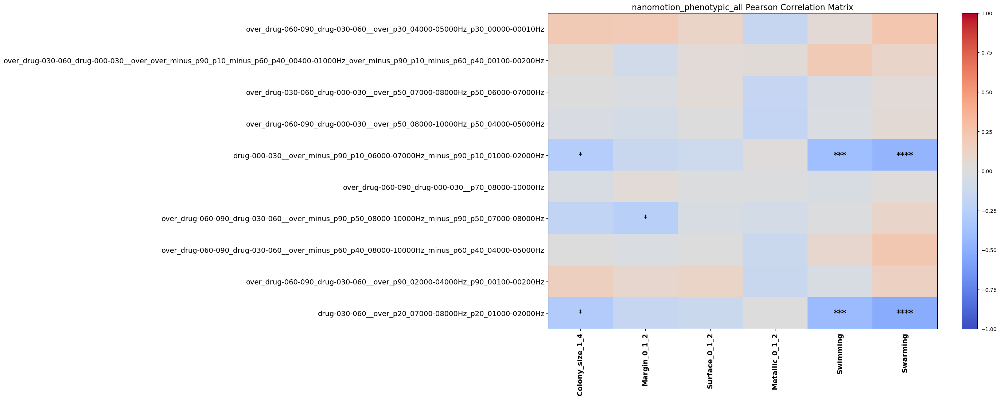

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


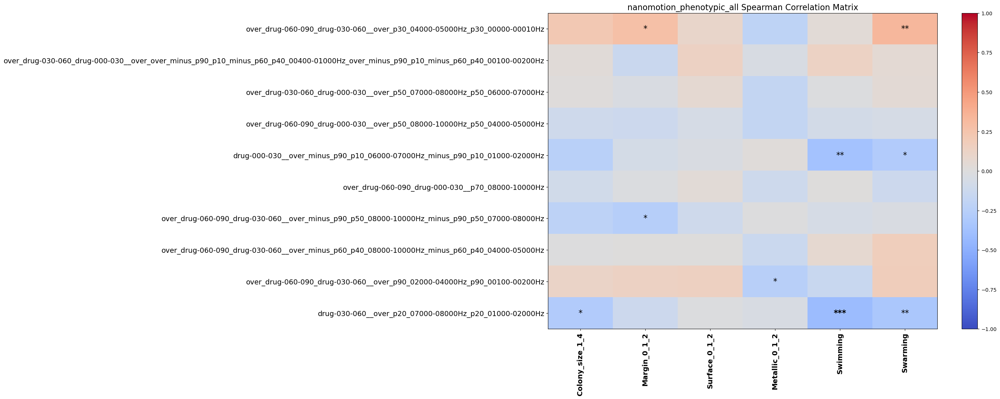

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


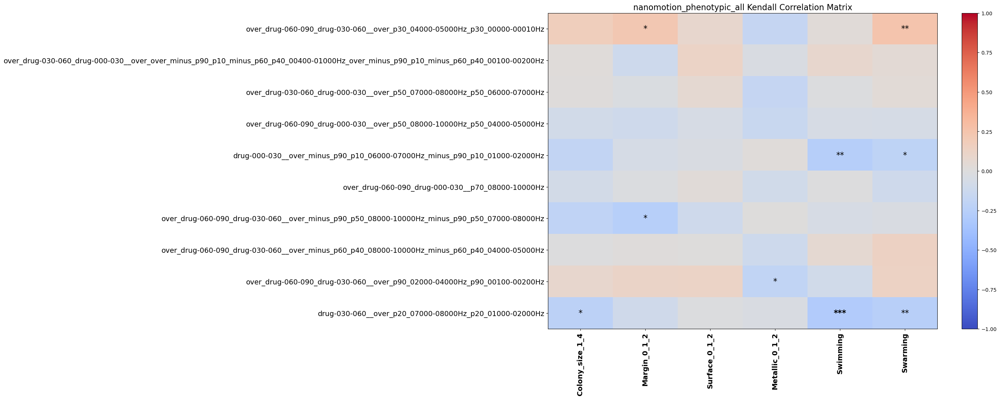

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [708]:
run_pairwise_analysis(
    df1 = nanomotion_features, 
    df2 = phenotypic,
    output_pair= "nanomotion_phenotypic_all",
    base_output_folder = output_folder
);

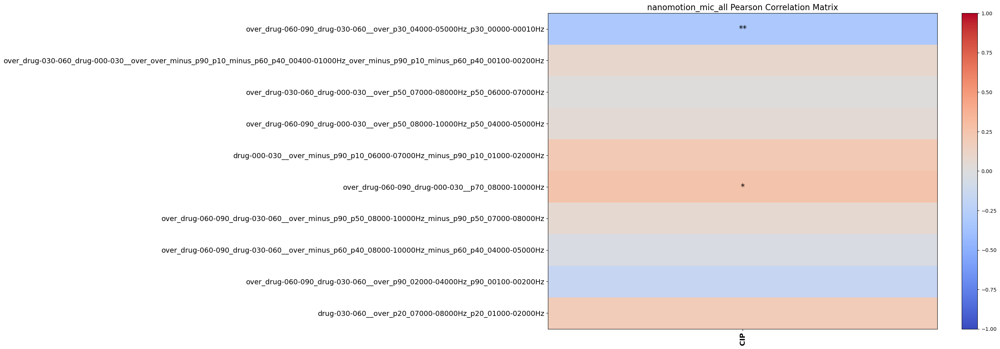

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


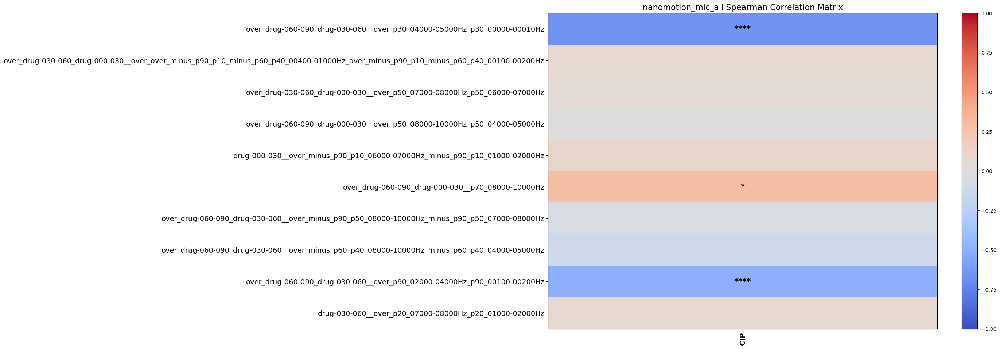

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


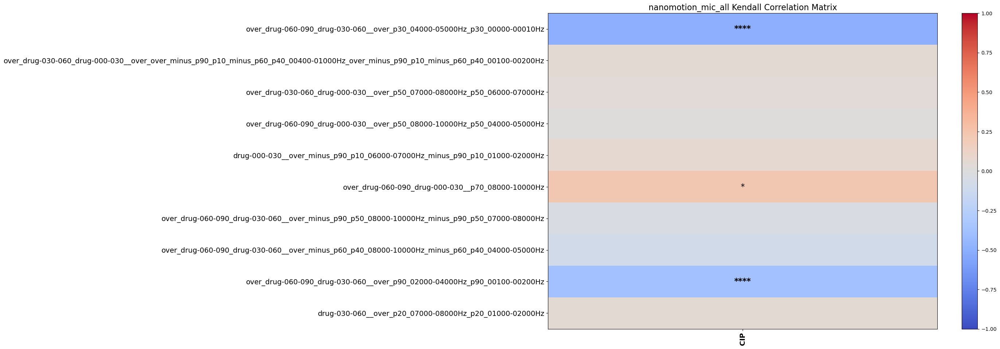

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [709]:

#MIC
# 2. Filter and reorder rows by df_nanomotion['strain_name']
#ordered = phenotypic_ordered_df.set_index('strain').loc[df['strain_name']]

# 3. Keep only the first row of every 3 rows (0, 3, 6, ...)
#ordered = ordered.iloc[::3, :]

# 4. Add 'strain' as first column + selected phenotypic columns
final_cols = ['CIP']

# 5. Final result
mic = phenotypic_ordered_df.reset_index()[final_cols]


run_pairwise_analysis(
    df1 = nanomotion_features, 
    df2 = mic,
    output_pair= "nanomotion_mic_all",
    base_output_folder = output_folder
);

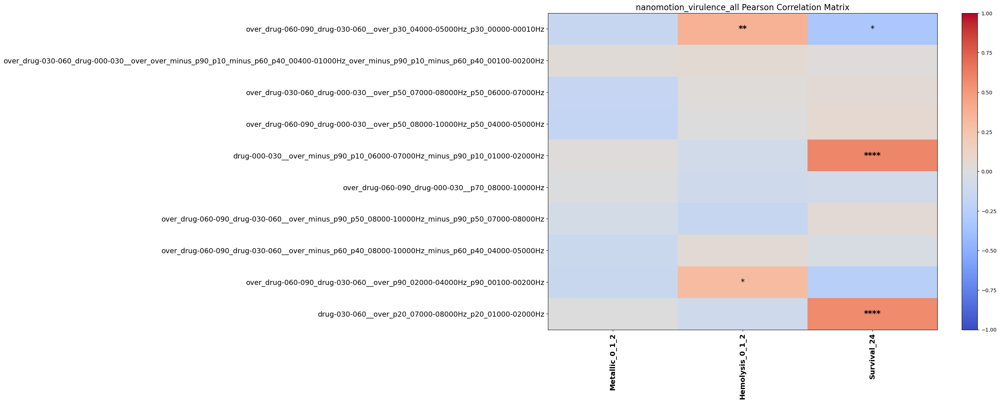

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


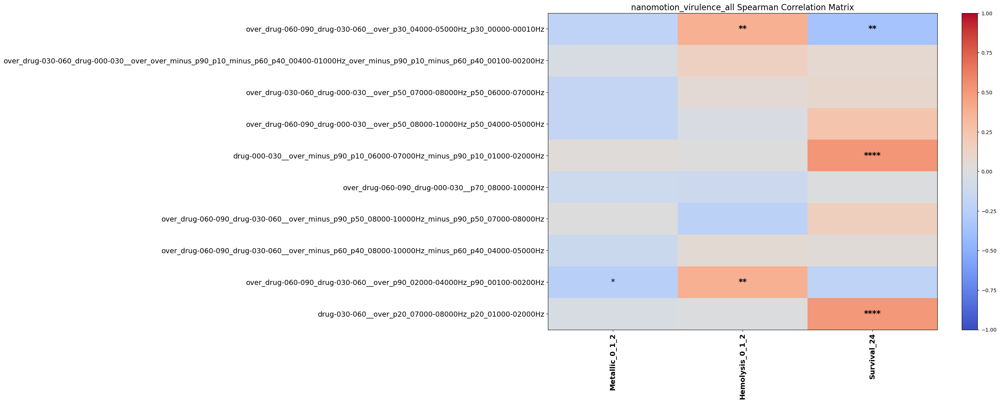

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


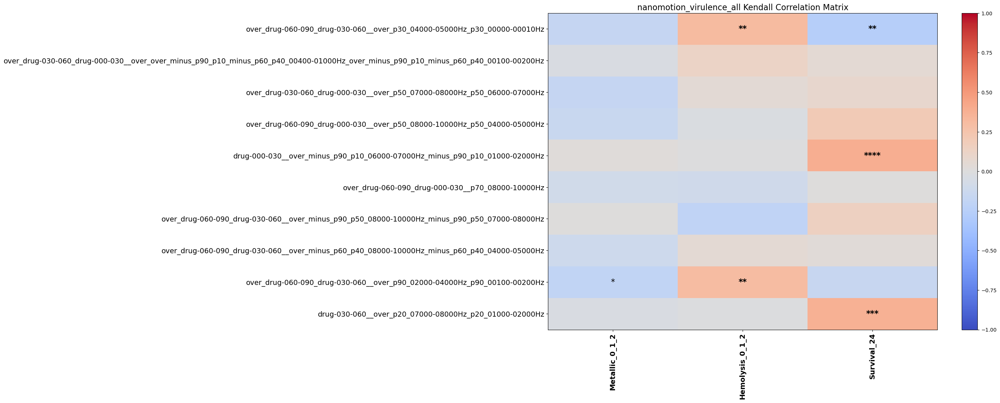

/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_161030/4143137353.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [710]:
# 2. Filter and reorder rows by df_nanomotion['strain_name']
#ordered = phenotypic_ordered_df.set_index('strain').loc[df['strain_name']]

# 3. Keep only the first of every 3 duplicate rows
#ordered = ordered.iloc[::3, :]

# 4. Select columns X–Z (0-indexed positions 23, 24, 25)
final_cols = [23, 24, 25]

# 5. Extract these columns correctly
virulence = phenotypic_ordered_df.reset_index().iloc[:, final_cols]

run_pairwise_analysis(
    df1 = nanomotion_features, 
    df2 = virulence,
    output_pair= "nanomotion_virulence_all",
    base_output_folder = output_folder
);


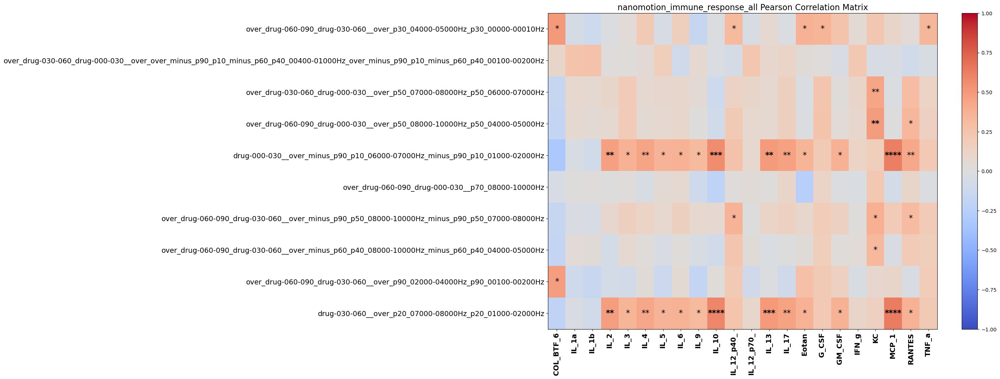

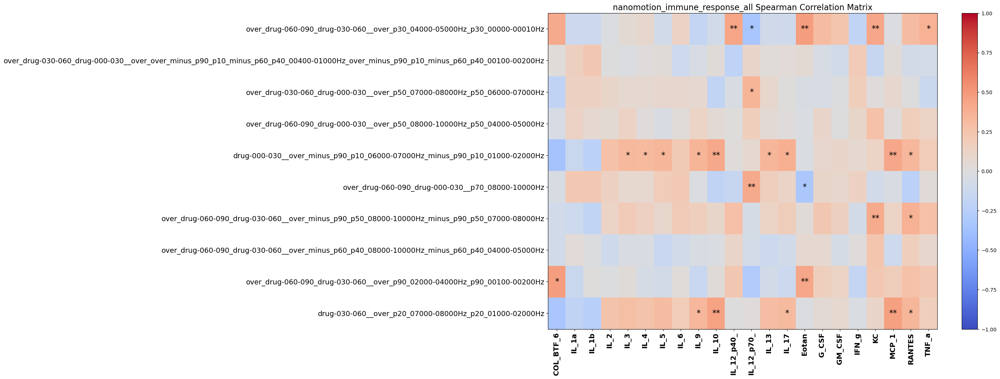

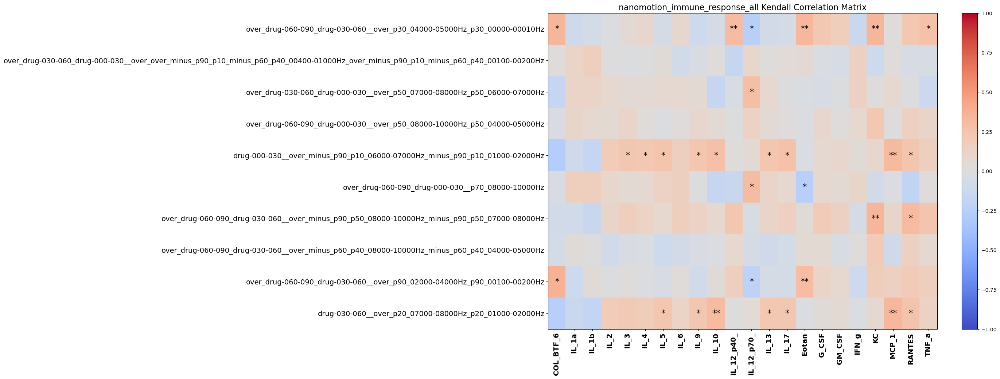

In [711]:

# Keep only first of every 3 duplicates
#ordered = ordered.iloc[::3, :]
start = col_letter_to_index("AI")   # inclusive
end   = col_letter_to_index("BD")   # inclusive

immune_response = phenotypic_ordered_df.reset_index().iloc[:, start : end + 1]

run_pairwise_analysis(
    df1 = nanomotion_features, 
    df2 = immune_response,
    output_pair= "nanomotion_immune_response_all",
    base_output_folder = output_folder
);


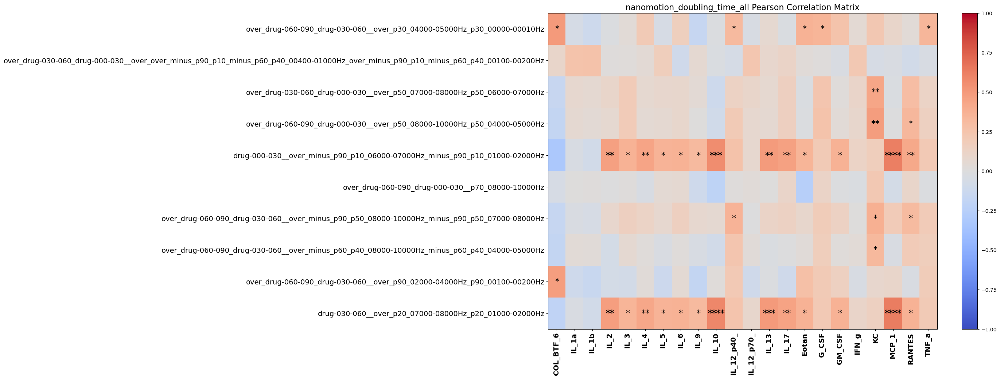

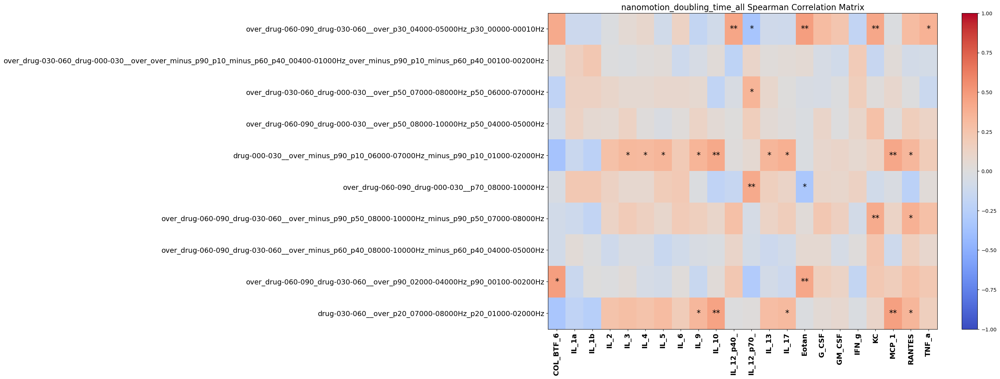

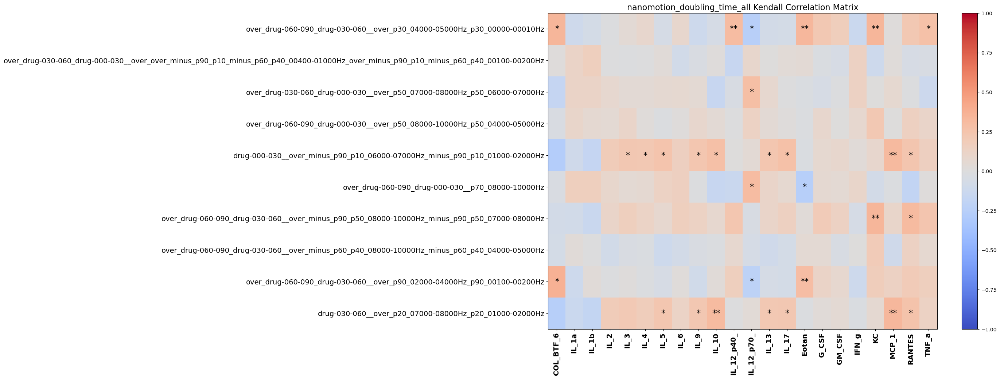

In [712]:
# Keep only first of every 3 duplicates



doubling_time =  phenotypic_ordered_df.reset_index().iloc[:, start : end + 1]


run_pairwise_analysis(
    df1 = nanomotion_features, 
    df2 = doubling_time,
    output_pair= "nanomotion_doubling_time_all",
    base_output_folder = output_folder
);
